In [1]:
!pip install kaggle

In [2]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"llloooeee123","key":"cf69ac4e2ce7f5a00e7c3189f92cad62"}'}

In [3]:
!mkdir -p ~/.kaggle

!cp kaggle.json ~/.kaggle/

!chmod 600 ~/.kaggle/kaggle.json

In [4]:
!kaggle datasets download -d nikhilpandey360/chest-xray-masks-and-labels

100% 9.57G/9.58G [04:52<00:00, 31.3MB/s]
100% 9.58G/9.58G [04:52<00:00, 35.2MB/s]


In [ ]:
!unzip /content/chest-xray-masks-and-labels.zip

In [6]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import tensorflow as tf # importing TensorFlow for machine learning
import os # operating system interactions
import PIL # Python Imaging Library for image processing
from glob import glob # for finding file paths matching a specified pattern
import re # regular expressions
from collections import defaultdict # for default dictionary functionalities
import matplotlib.pyplot as plt # for plotting graphs
from tqdm import tqdm # progress bars
import cv2 # OpenCV for computer vision tasks

# Setting the directory for data
DIR = "/content/data"

# Finding paths for lung images and masks
lung_image_paths = glob(os.path.join(DIR,"Lung Segmentation/CXR_png/*.png")) # glob pattern for lung x-ray images
mask_image_paths = glob(os.path.join(DIR,"Lung Segmentation/masks/*.png")) # glob pattern for masks

# Initializing a default dictionary to relate lung images and their masks
related_paths = defaultdict(list)

# Looping through lung images to find corresponding masks
for img_path in lung_image_paths:
    img_match = re.search("CXR_png/(.*)\.png$", img_path) # regular expression to extract image name
    if img_match:
        img_name = img_match.group(1) # extracting the image name
        for mask_path in mask_image_paths:
            mask_match = re.search(img_name, mask_path) # searching for the corresponding mask
            if mask_match:
                # Appending related image and mask paths
                related_paths["image_path"].append(img_path)
                related_paths["mask_path"].append(mask_path)

# Creating a DataFrame to hold the paths of images and their corresponding masks
paths_df = pd.DataFrame.from_dict(related_paths)

In [7]:
def prepare_train_test(df=pd.DataFrame(), resize_shape=tuple(), color_mode="rgb"):
    """
    Function: prepare_train_test
    This function processes a dataset of images, including the images and their corresponding masks.
    It resizes the images and masks to a specified size and processes them based on the desired color mode.

    Parameters:
    - df: A pandas DataFrame containing paths to images ('image_path') and their corresponding masks ('mask_path').
    - resize_shape: A tuple specifying the target size to which images and masks will be resized (e.g., (256, 256)).
    - color_mode: A string indicating the color mode for processing images ('rgb' or 'gray').

    Returns:
    - A tuple containing two lists:
        1. img_array: A list of processed images.
        2. mask_array: A list of processed masks corresponding to the images.
    """

    # Initialize lists to store processed images and masks
    img_array = []
    mask_array = []

    # Process each image in the DataFrame
    for image_path in tqdm(df['image_path']):
        # Read and resize the image
        resized_image = cv2.resize(cv2.imread(image_path), resize_shape)
        # Normalize pixel values
        resized_image = resized_image / 255.0

        # Append processed image to the list based on the color mode
        if color_mode == "gray":
            # For grayscale, keep only the first channel
            img_array.append(resized_image[:, :, 0])
        elif color_mode == "rgb":
            # For RGB, keep all channels
            img_array.append(resized_image)

    # Process each mask in the DataFrame
    for mask_path in tqdm(df['mask_path']):
        # Read and resize the mask
        resized_mask = cv2.resize(cv2.imread(mask_path), resize_shape)
        # Normalize pixel values
        resized_mask = resized_mask / 255.0
        # Append the first channel (grayscale mask) to the list
        mask_array.append(resized_mask[:, :, 0])

    # Return the lists of processed images and masks
    return img_array, mask_array

# Example usage of the function
# img_array, mask_array = prepare_train_test(df=your_dataframe, resize_shape=(256, 256), color_mode="gray")

img_array, mask_array = prepare_train_test(df = paths_df, resize_shape = (256,256), color_mode = "gray")

100%|██████████| 704/704 [00:52<00:00, 13.41it/s]


In [9]:
from sklearn.model_selection import train_test_split
img_train, img_test, mask_train, mask_test = train_test_split(img_array, mask_array, test_size = 0.2, random_state= 42)

img_side_size = 256
img_train = np.array(img_train).reshape(len(img_train), img_side_size, img_side_size, 1)
img_test = np.array(img_test).reshape(len(img_test), img_side_size, img_side_size, 1)
mask_train = np.array(mask_train).reshape(len(mask_train), img_side_size, img_side_size, 1)
mask_test = np.array(mask_test).reshape(len(mask_test), img_side_size, img_side_size, 1)


In [10]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, concatenate
from keras.optimizers import Adam
from keras import backend as keras
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping
from tensorflow.keras.metrics import MeanIoU
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, concatenate, Conv2DTranspose, BatchNormalization, Activation

# Function to calculate the Dice Coefficient, a common metric in image segmentation
def dice_coef(y_true, y_pred):
    # Flatten the arrays for calculation
    y_true_flat = K.flatten(y_true)
    y_pred_flat = K.flatten(y_pred)
    # Calculate the intersection
    intersection = K.sum(y_true_flat * y_pred_flat)
    # Dice Coefficient formula
    return (2. * intersection + 1) / (K.sum(y_true_flat) + K.sum(y_pred_flat) + 1)

# Function to calculate the Dice Loss, negative of the Dice Coefficient
def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

# Function to create a convolutional block, used in the U-Net architecture
def conv_block(inputs, num_filters, kernel_size=(3, 3), activation='relu'):
    # First convolution layer
    conv1 = Conv2D(num_filters, kernel_size, padding='same')(inputs)
    conv1 = BatchNormalization()(conv1)
    conv1 = Activation(activation)(conv1)
    # Second convolution layer
    conv2 = Conv2D(num_filters, kernel_size, padding='same')(conv1)
    conv2 = BatchNormalization()(conv2)
    conv2 = Activation(activation)(conv2)
    return conv2

# Function to create a residual block, adding input to the output of a convolution block
def residual_block(inputs, num_filters, kernel_size=(3, 3), activation='relu'):
    # Create convolution block
    conv = conv_block(inputs, num_filters, kernel_size, activation)
    # Concatenate input to the output of the convolution block
    concat = concatenate([conv, inputs], axis=3)
    return concat

# Function to build the U-Net model with added residual connections
def unet_with_resnet(input_size=(256, 256, 1)):
    # Input layer
    inputs = Input(input_size)

    # Encoder path
    conv1 = residual_block(inputs, 32)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = residual_block(pool1, 64)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = residual_block(pool2, 128)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = residual_block(pool3, 256)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    # Middle block
    conv5 = residual_block(pool4, 512)

    # Decoder path
    up6 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5), conv4], axis=3)
    conv6 = residual_block(up6, 256)

    up7 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6), conv3], axis=3)
    conv7 = residual_block(up7, 128)

    up8 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7), conv2], axis=3)
    conv8 = residual_block(up8, 64)

    up9 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8), conv1], axis=3)
    conv9 = residual_block(up9, 32)

    # Output layer
    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv9)

    # Construct and return the model
    return Model(inputs=[inputs], outputs=[conv10])

# Create the model

In [11]:
EPOCHS = 100

# Compile your model with appropriate metrics
model = unet_with_resnet()
# Adjust learning rate
model.compile(optimizer=Adam(lr=1e-4), loss="binary_crossentropy",
              metrics=[dice_coef, 'accuracy'])


model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 32)         320       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 256, 256, 32)         128       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 256, 256, 32)         0         ['batch_normalization[0][0

In [13]:
# Early stopping based on validation dice coefficient
earlystopping = EarlyStopping(monitor='val_dice_coef', patience=20, mode='max')

# Train your model
history = model.fit(x=img_train, y=mask_train, validation_data=(img_test, mask_test),
                    epochs=EPOCHS, batch_size=16, callbacks=[earlystopping])

Epoch 1/100
36/36 [==============================] - 5s 147ms/step - loss: 0.0489 - dice_coef: 0.9448 - accuracy: 0.9804 - val_loss: 0.1623 - val_dice_coef: 0.8354 - val_accuracy: 0.9389
Epoch 2/100
36/36 [==============================] - 5s 139ms/step - loss: 0.0506 - dice_coef: 0.9441 - accuracy: 0.9802 - val_loss: 1.3792 - val_dice_coef: 0.2207 - val_accuracy: 0.7729
Epoch 3/100
36/36 [==============================] - 5s 139ms/step - loss: 0.0456 - dice_coef: 0.9474 - accuracy: 0.9814 - val_loss: 0.1730 - val_dice_coef: 0.8569 - val_accuracy: 0.9447
Epoch 4/100
36/36 [==============================] - 5s 139ms/step - loss: 0.0455 - dice_coef: 0.9475 - accuracy: 0.9812 - val_loss: 0.0706 - val_dice_coef: 0.9359 - val_accuracy: 0.9750
Epoch 5/100
36/36 [==============================] - 5s 139ms/step - loss: 0.0441 - dice_coef: 0.9487 - accuracy: 0.9818 - val_loss: 0.0726 - val_dice_coef: 0.9238 - val_accuracy: 0.9732
Epoch 6/100
36/36 [==============================] - 5s 139ms/ste

1/1 [==============================] - 1s 1s/step


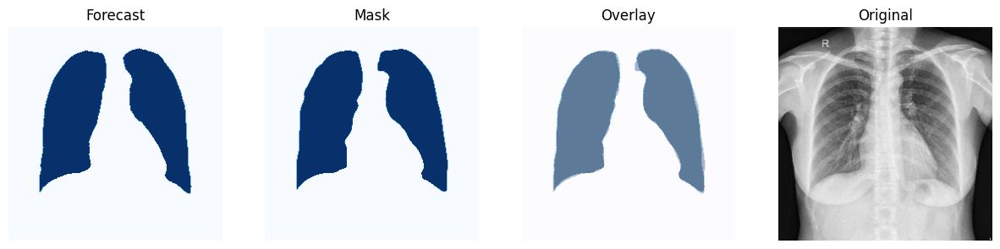

0.9749849669417237

In [14]:
def test_on_image(model, img_array, img_num, img_side_size=128, file_name=None):
    pred = model.predict(img_array[img_num].reshape(1, img_side_size, img_side_size, 1))
    pred[pred > 0.5] = 1.0
    pred[pred < 0.5] = 0.0
    fig = plt.figure(figsize=(15, 10))

    plt.subplot(2, 4, 1)  # Increase the number of rows to accommodate the file name
    plt.imshow(pred.reshape(img_side_size, img_side_size), cmap="Blues")
    plt.title("Forecast")
    plt.axis("off")

    plt.subplot(2, 4, 2)  # Increase the number of rows to accommodate the file name
    plt.imshow(mask_test[img_num].reshape(img_side_size, img_side_size), cmap="Blues")
    plt.title("Mask")
    plt.axis("off")

    plt.subplot(2, 4, 3)  # Increase the number of rows to accommodate the file name
    plt.imshow(mask_test[img_num].reshape(img_side_size, img_side_size), cmap="Blues", alpha=0.5)
    plt.imshow(pred.reshape(img_side_size, img_side_size), cmap="PuBu", alpha=0.3)
    plt.title("Overlay")
    plt.axis("off")

    plt.subplot(2, 4, 4)  # Increase the number of rows to accommodate the file name
    plt.imshow(img_array[img_num].reshape(img_side_size, img_side_size), cmap="gray")
    plt.title("Original")
    plt.axis("off")

    if file_name is not None:
        plt.subplot(2, 4, 5)  # Create a new row for the file name
        plt.text(0.5, 0.5, file_name, fontsize=12, ha="center")
        plt.axis("off")

    plt.show()

    return pred

def dice_coef_test(y_true, y_pred):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    union = np.sum(y_true_f) + np.sum(y_pred_f)
    if union==0: return 1
    intersection = np.sum(y_true_f * y_pred_f)
    return 2. * intersection / union

IMG_NUM = 3
prediction = test_on_image(model, img_array = img_test, img_num = IMG_NUM, img_side_size = 256)
dice_coef_test(y_true = mask_test[IMG_NUM], y_pred = prediction)

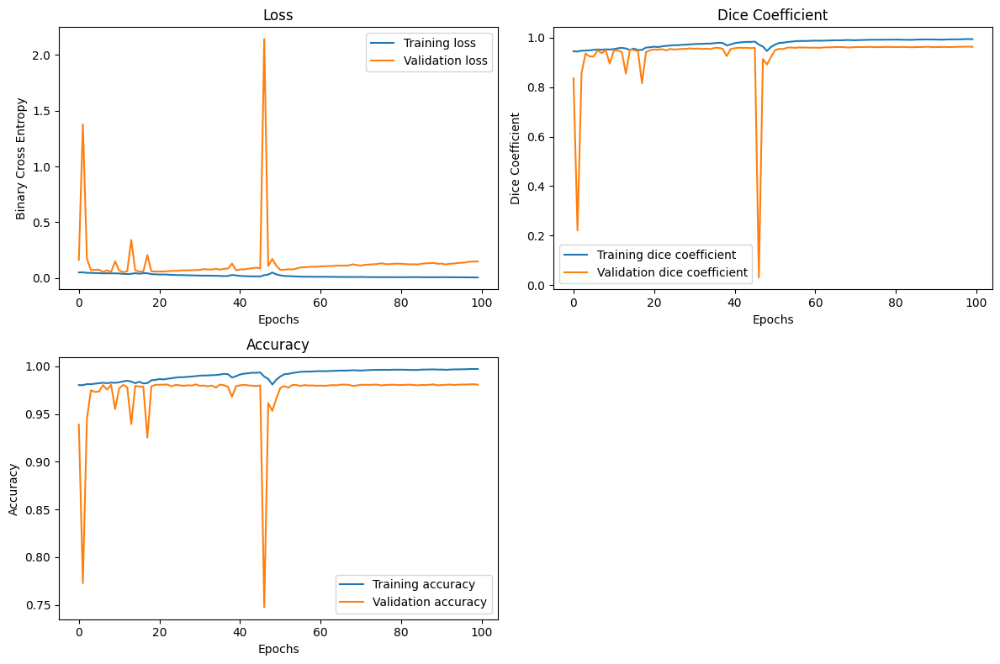

In [15]:
def get_metrics(history):
    fig = plt.figure(figsize=(12, 8))

    # Plot training and validation loss
    plt.subplot(2, 2, 1)
    plt.plot(history.history["loss"], label="Training loss")
    plt.plot(history.history["val_loss"], label="Validation loss")
    plt.legend()
    plt.xlabel("Epochs")
    plt.ylabel("Binary Cross Entropy")
    plt.title("Loss")

    # Plot training and validation dice coefficient
    plt.subplot(2, 2, 2)
    plt.plot(history.history["dice_coef"], label="Training dice coefficient")
    plt.plot(history.history["val_dice_coef"], label="Validation dice coefficient")
    plt.legend()
    plt.xlabel("Epochs")
    plt.ylabel("Dice Coefficient")
    plt.title("Dice Coefficient")

    # Plot training and validation accuracy
    plt.subplot(2, 2, 3)
    plt.plot(history.history["accuracy"], label="Training accuracy")
    plt.plot(history.history["val_accuracy"], label="Validation accuracy")
    plt.legend()
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.title("Accuracy")

    plt.tight_layout()
    plt.show()

# Call the function to plot metrics
get_metrics(history=history)

1/1 [==============================] - 0s 21ms/step


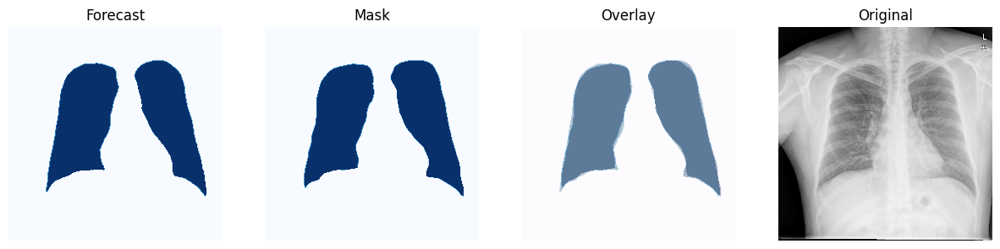

1/1 [==============================] - 0s 21ms/step


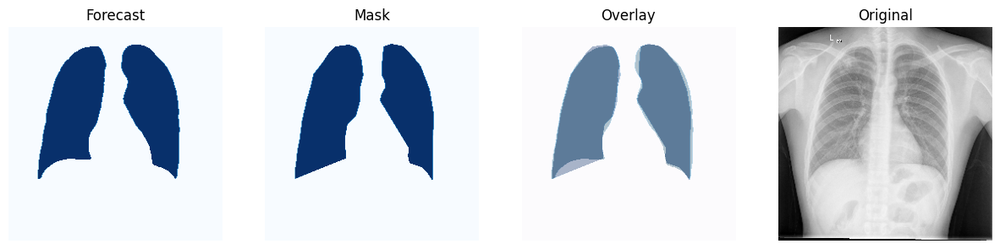

1/1 [==============================] - 0s 20ms/step


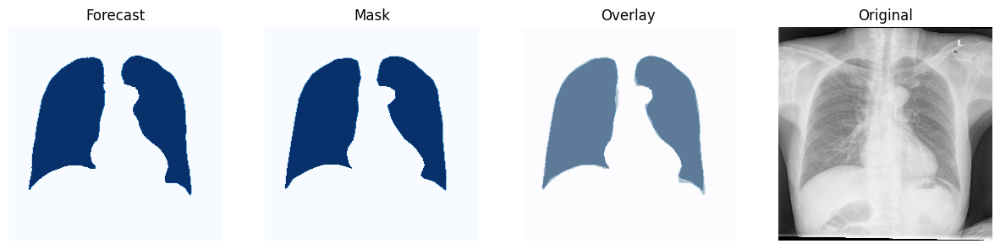

1/1 [==============================] - 0s 22ms/step


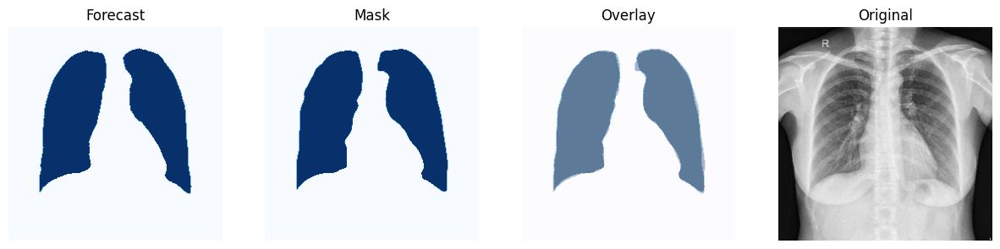

1/1 [==============================] - 0s 22ms/step


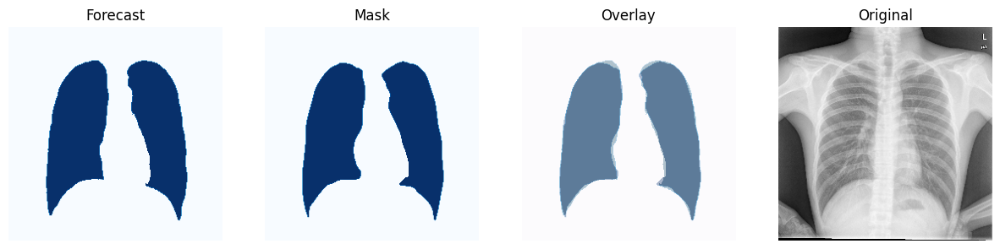

1/1 [==============================] - 0s 22ms/step


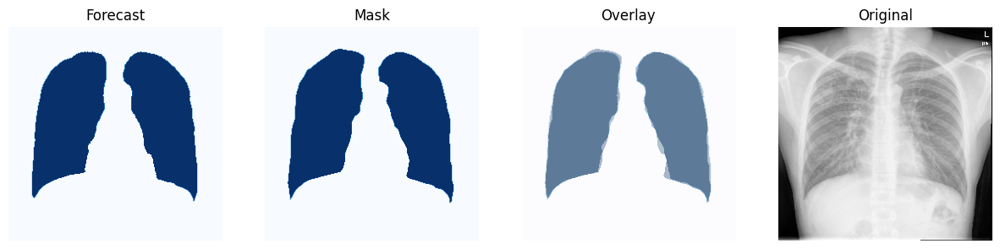

1/1 [==============================] - 0s 22ms/step


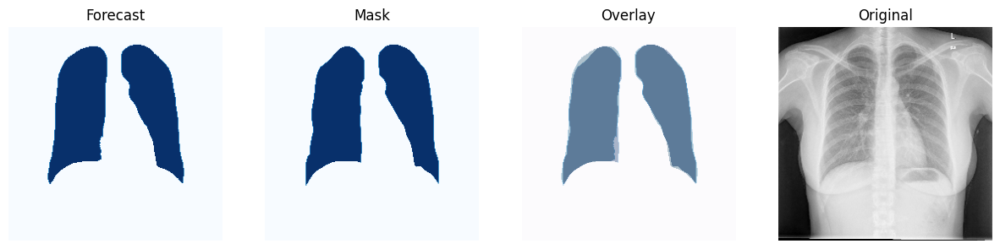

1/1 [==============================] - 0s 21ms/step


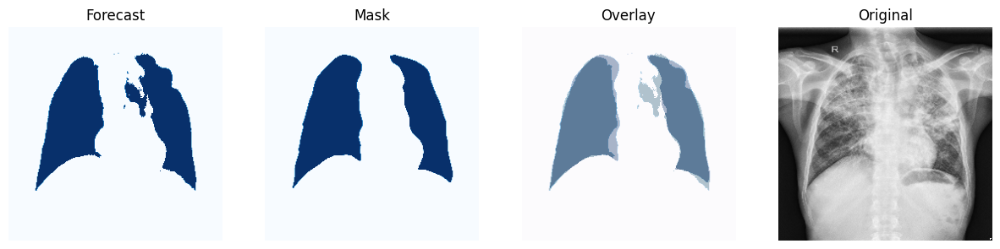

1/1 [==============================] - 0s 22ms/step


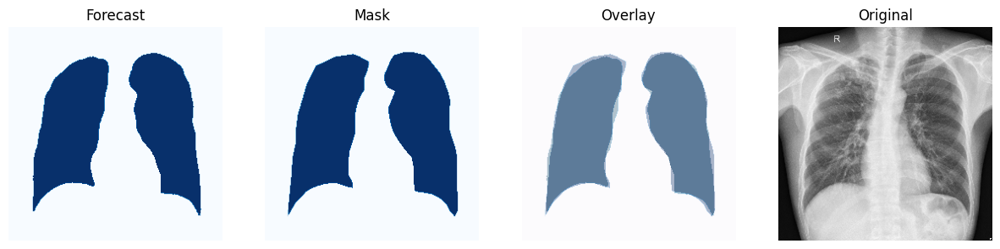

1/1 [==============================] - 0s 20ms/step


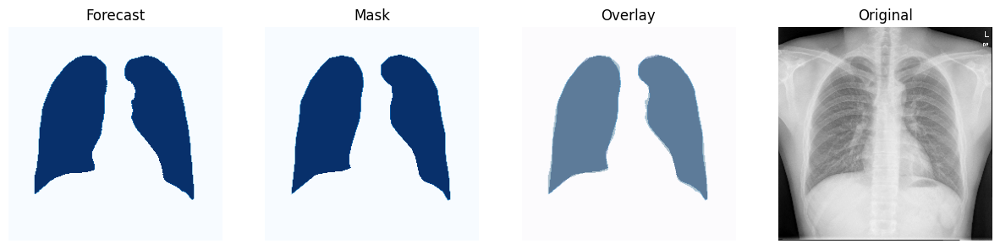

1/1 [==============================] - 0s 21ms/step


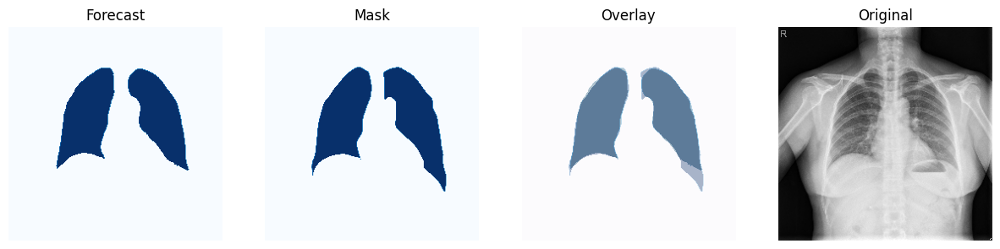

1/1 [==============================] - 0s 21ms/step


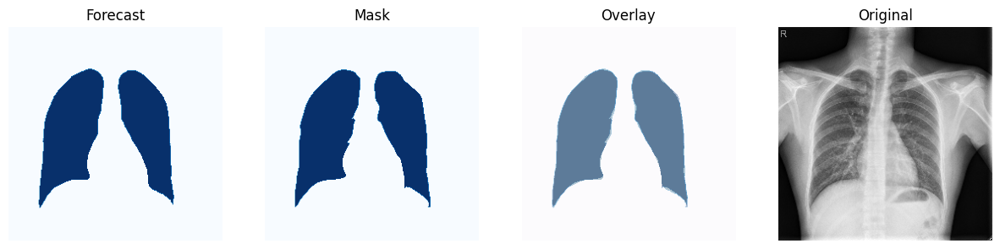

1/1 [==============================] - 0s 22ms/step


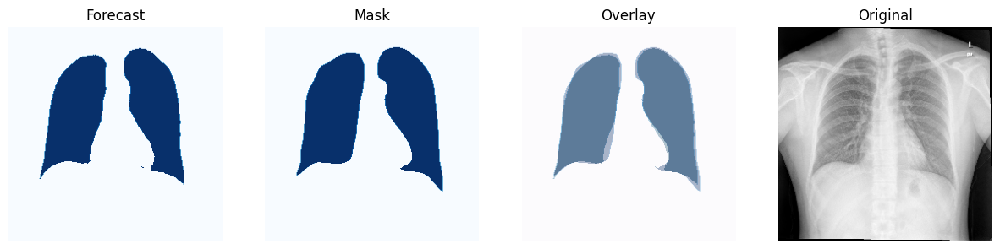

1/1 [==============================] - 0s 22ms/step


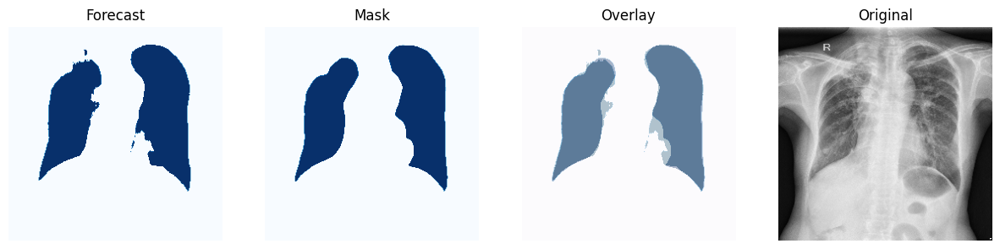

1/1 [==============================] - 0s 25ms/step


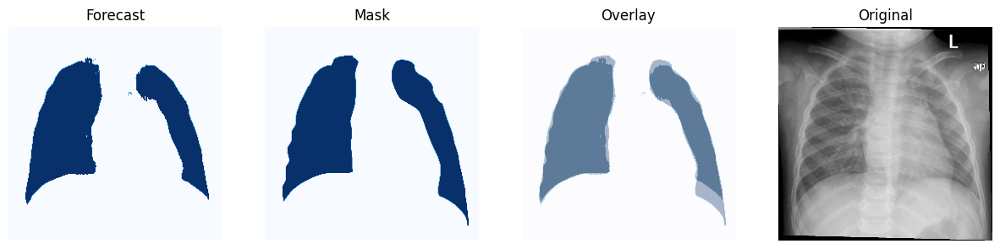

1/1 [==============================] - 0s 22ms/step


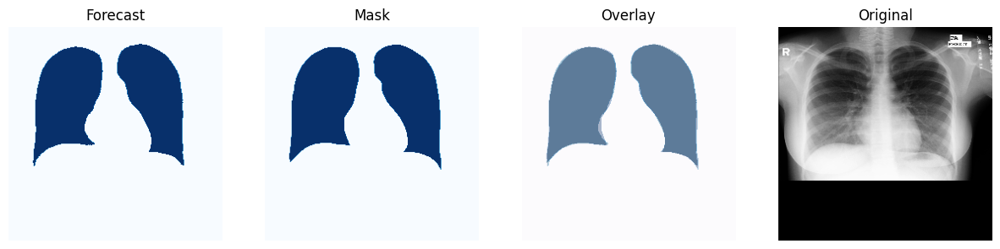

1/1 [==============================] - 0s 22ms/step


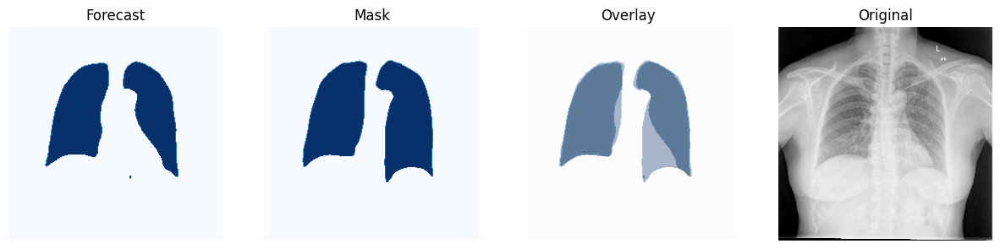

1/1 [==============================] - 0s 22ms/step


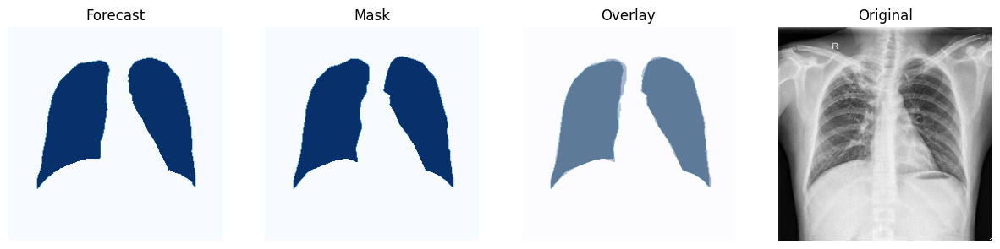

1/1 [==============================] - 0s 21ms/step


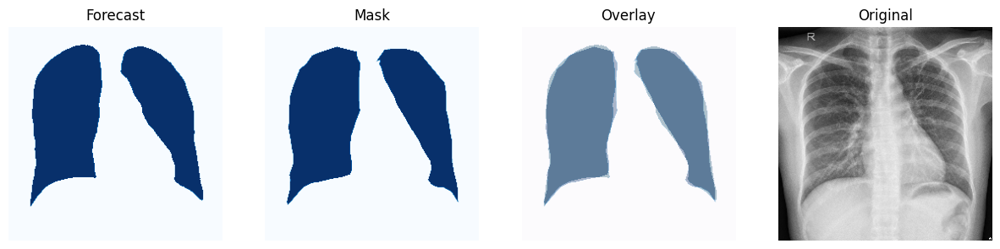

1/1 [==============================] - 0s 22ms/step


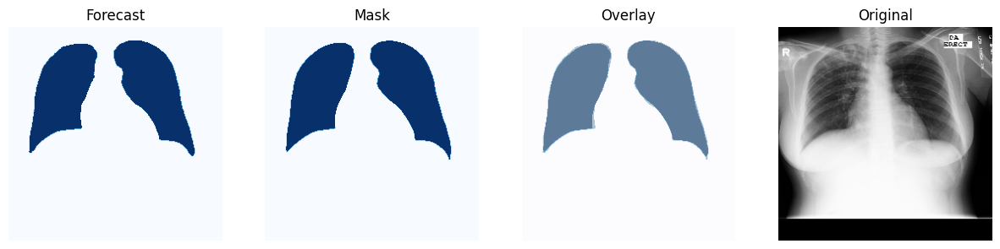

1/1 [==============================] - 0s 23ms/step


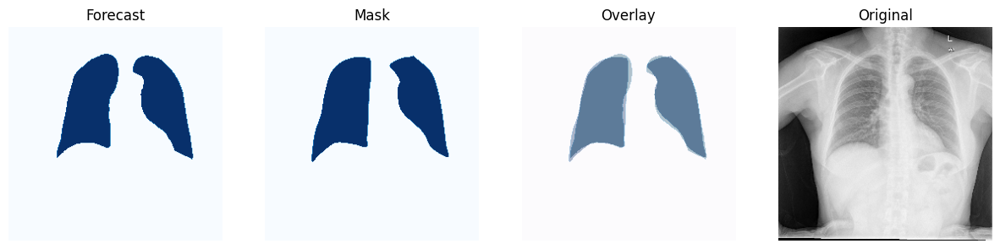

1/1 [==============================] - 0s 22ms/step


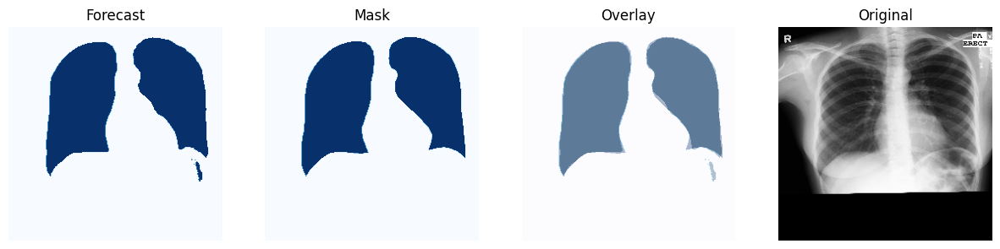

1/1 [==============================] - 0s 22ms/step


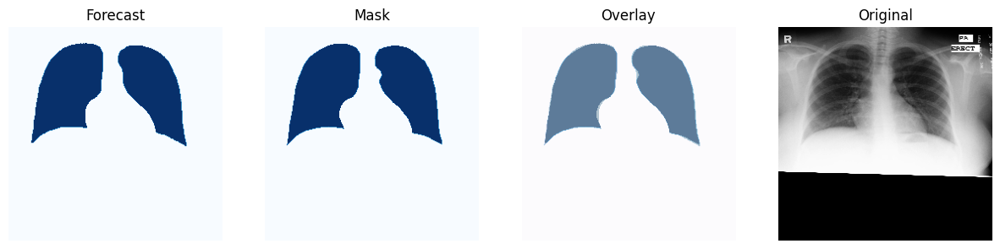

1/1 [==============================] - 0s 22ms/step


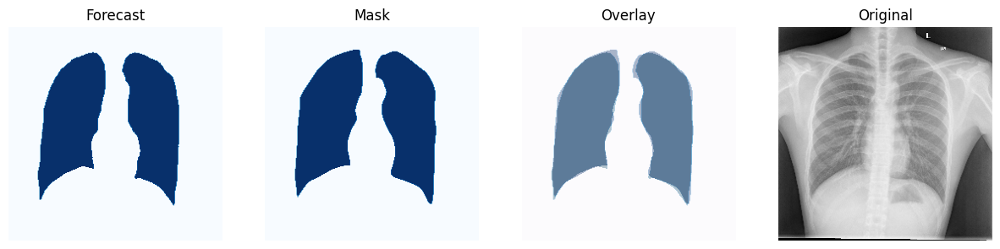

1/1 [==============================] - 0s 23ms/step


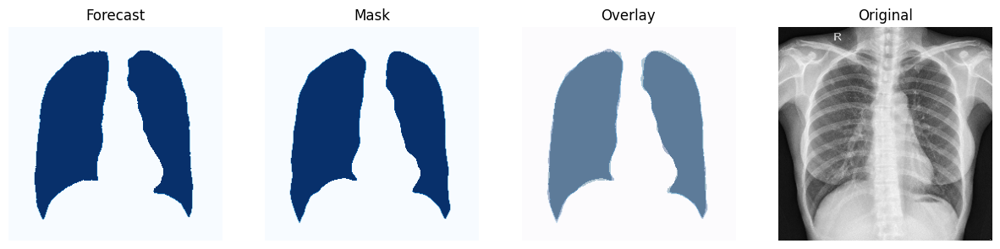

1/1 [==============================] - 0s 23ms/step


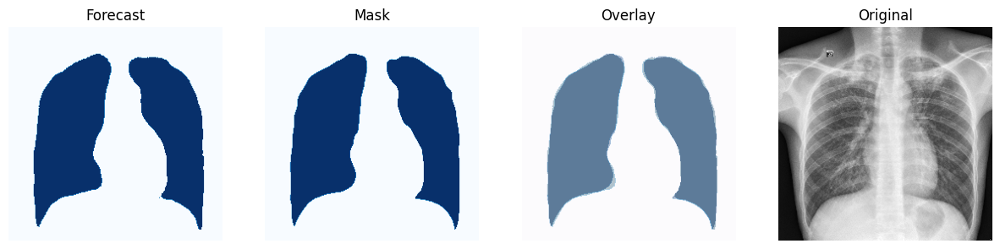

1/1 [==============================] - 0s 21ms/step


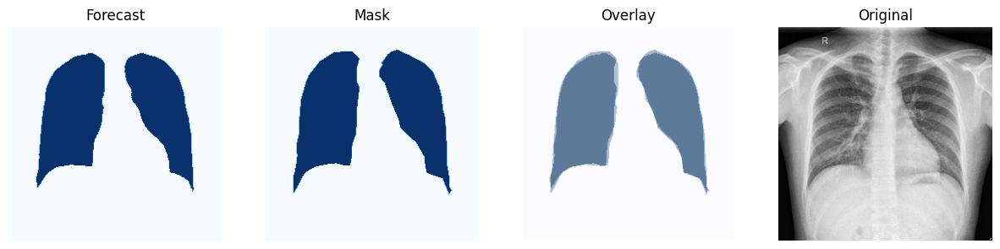

1/1 [==============================] - 0s 23ms/step


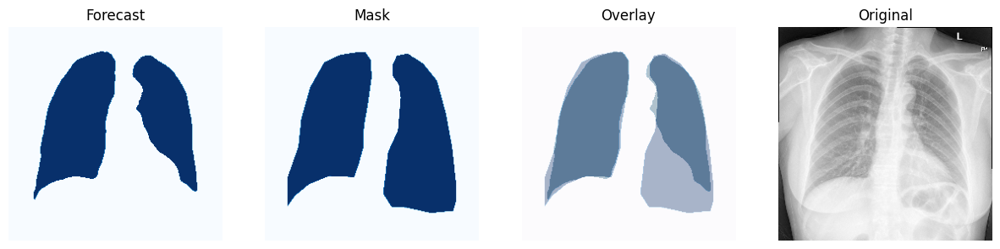

1/1 [==============================] - 0s 22ms/step


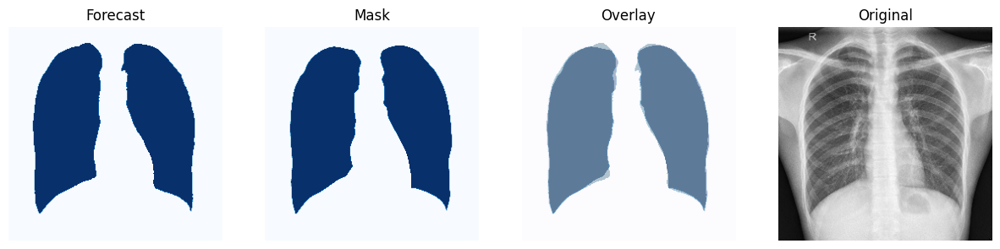

1/1 [==============================] - 0s 21ms/step


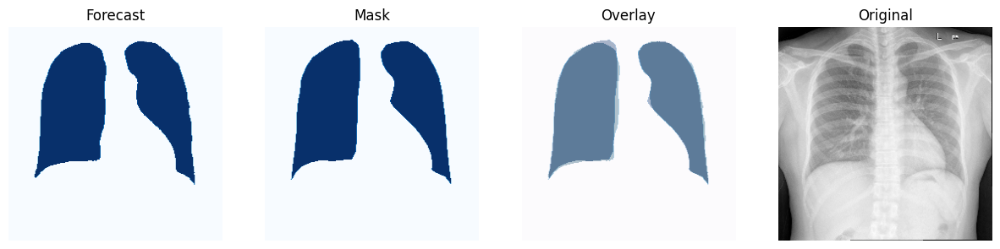

1/1 [==============================] - 0s 21ms/step


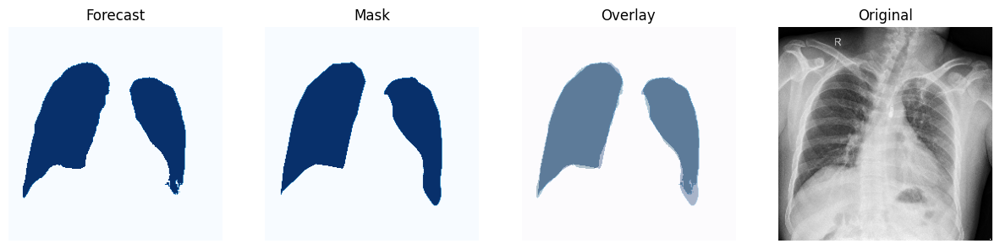

1/1 [==============================] - 0s 23ms/step


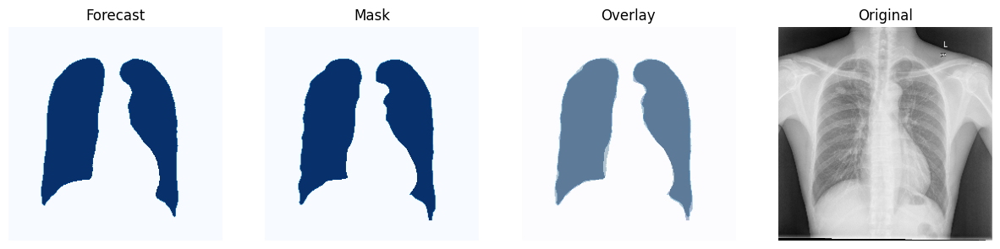

1/1 [==============================] - 0s 21ms/step


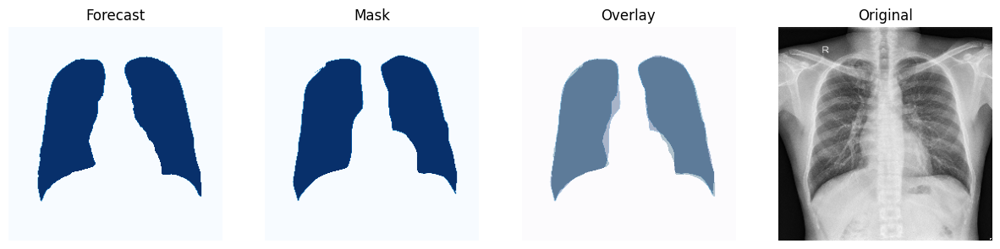

1/1 [==============================] - 0s 21ms/step


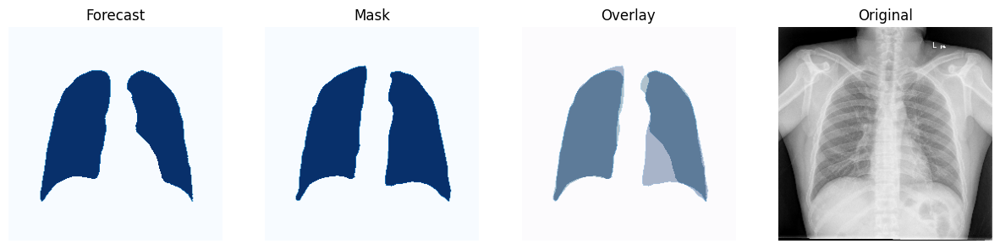

1/1 [==============================] - 0s 23ms/step


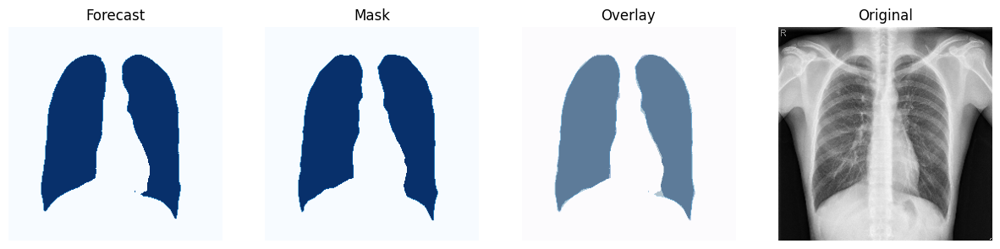

1/1 [==============================] - 0s 25ms/step


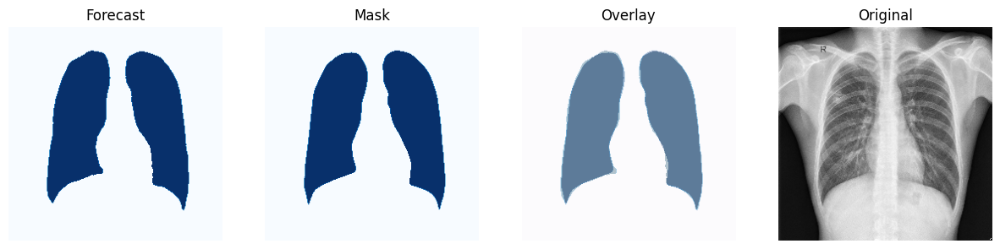

1/1 [==============================] - 0s 23ms/step


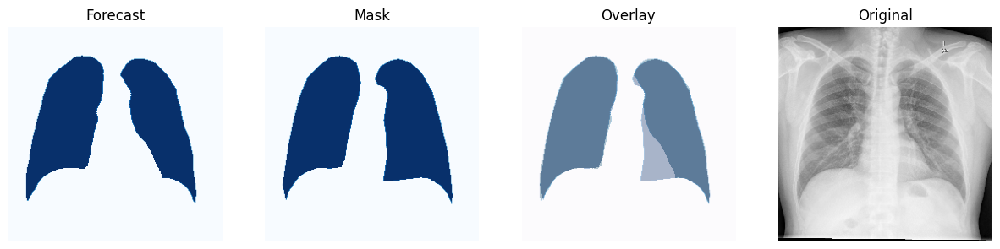

1/1 [==============================] - 0s 22ms/step


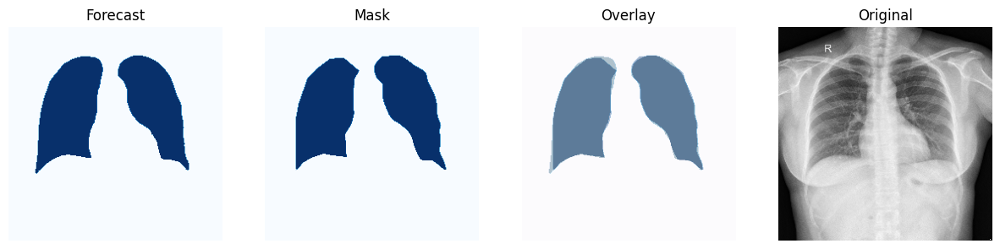

1/1 [==============================] - 0s 23ms/step


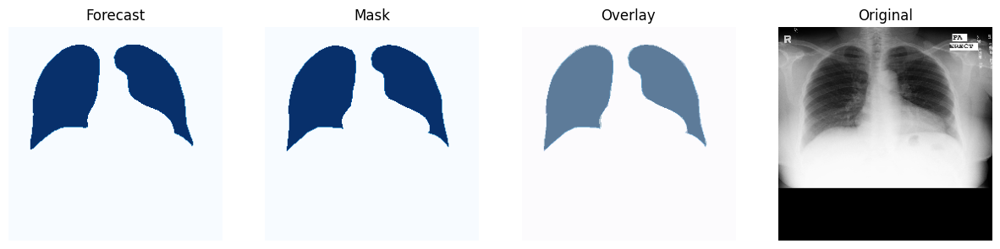

1/1 [==============================] - 0s 22ms/step


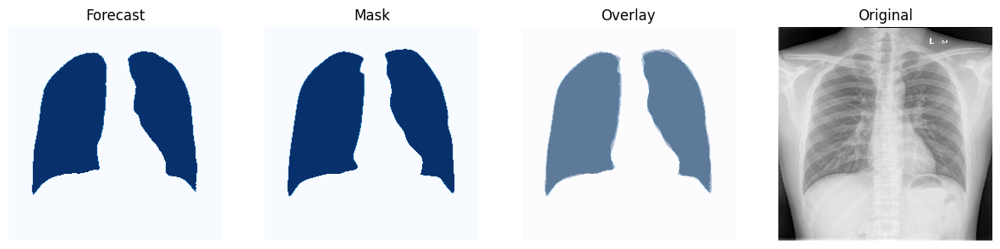

1/1 [==============================] - 0s 20ms/step


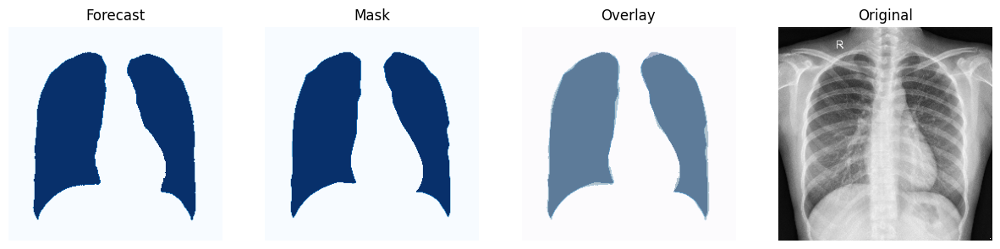

1/1 [==============================] - 0s 21ms/step


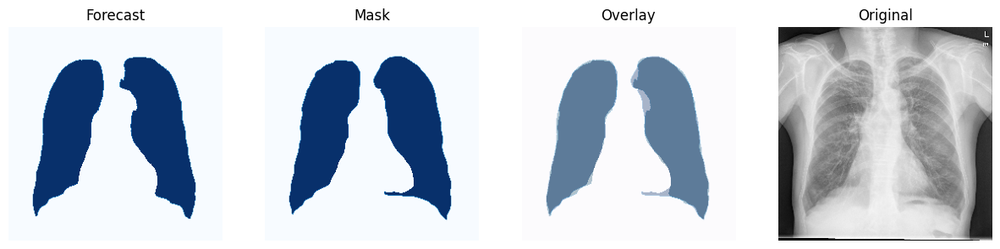

1/1 [==============================] - 0s 22ms/step


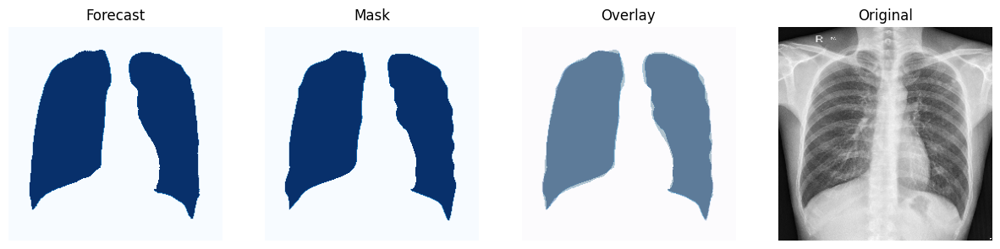

1/1 [==============================] - 0s 22ms/step


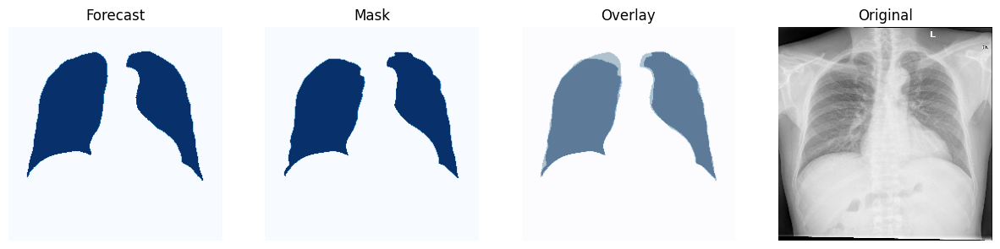

1/1 [==============================] - 0s 21ms/step


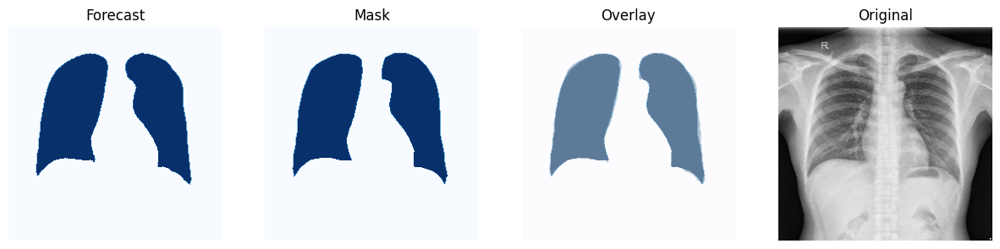

1/1 [==============================] - 0s 23ms/step


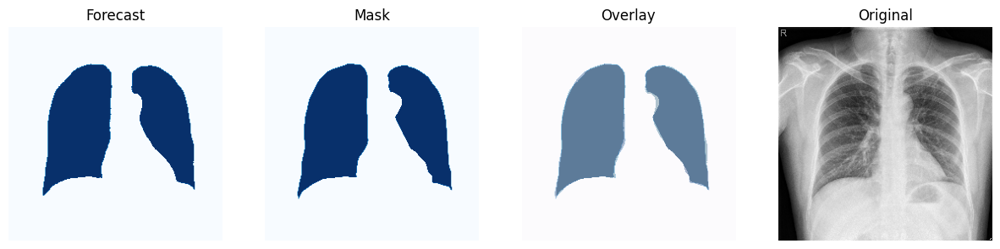

1/1 [==============================] - 0s 21ms/step


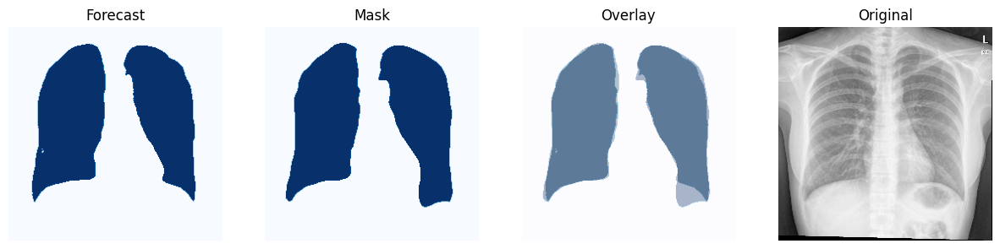

1/1 [==============================] - 0s 23ms/step


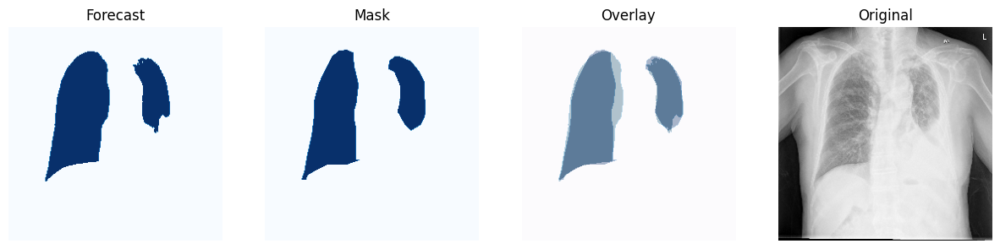

1/1 [==============================] - 0s 23ms/step


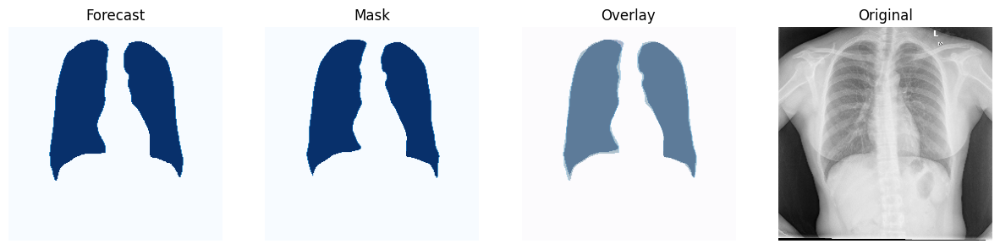

1/1 [==============================] - 0s 22ms/step


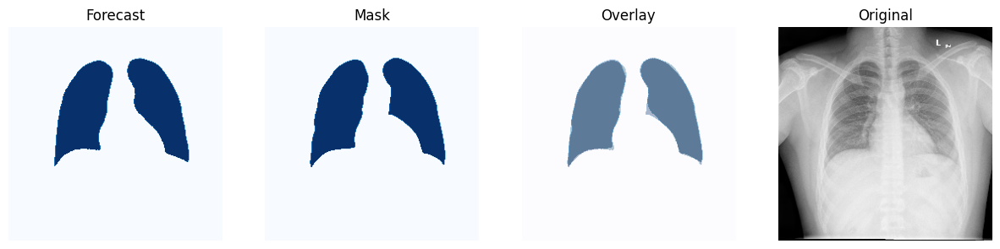

1/1 [==============================] - 0s 22ms/step


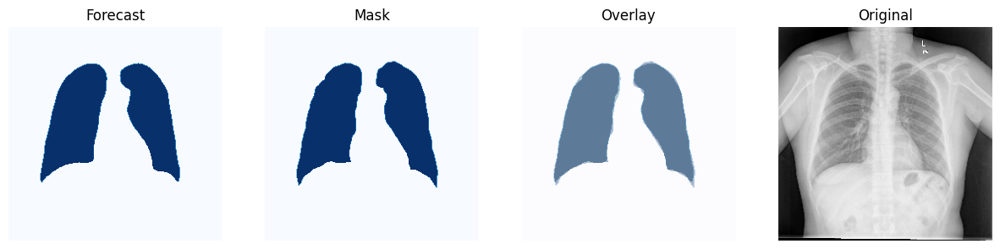

1/1 [==============================] - 0s 23ms/step


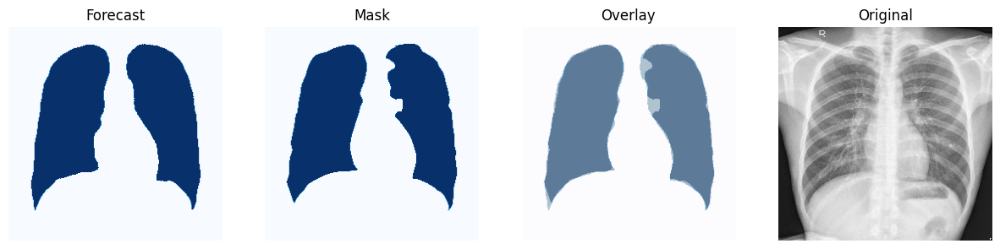

1/1 [==============================] - 0s 22ms/step


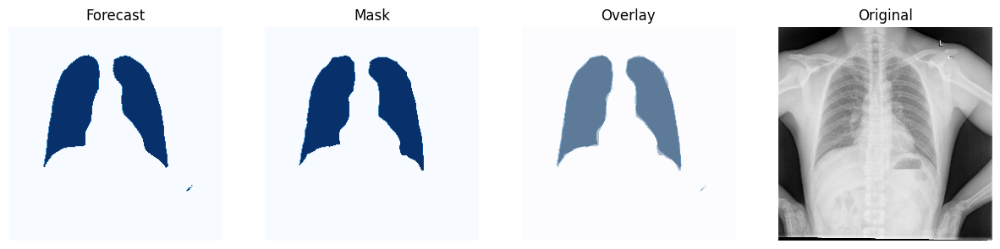

1/1 [==============================] - 0s 23ms/step


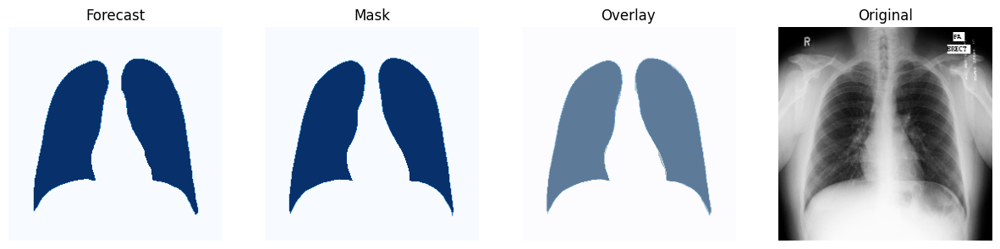

1/1 [==============================] - 0s 24ms/step


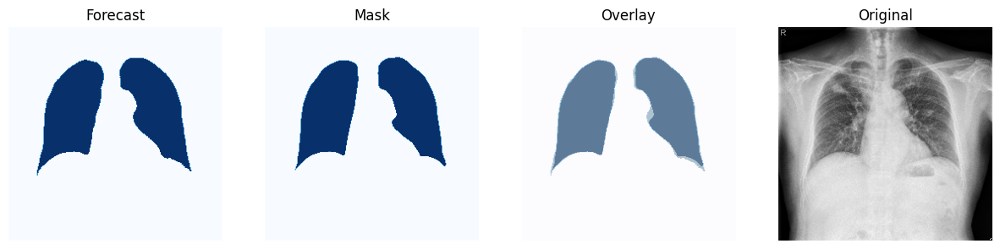

1/1 [==============================] - 0s 24ms/step


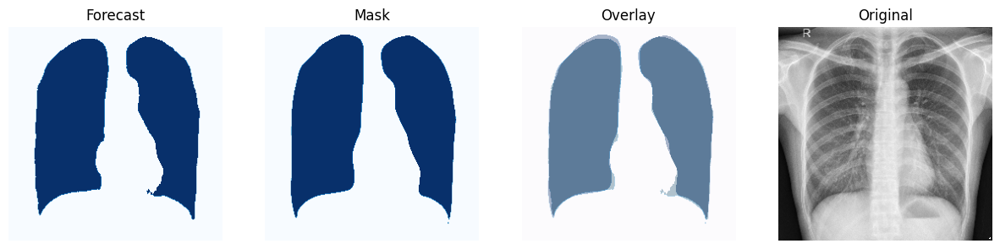

1/1 [==============================] - 0s 21ms/step


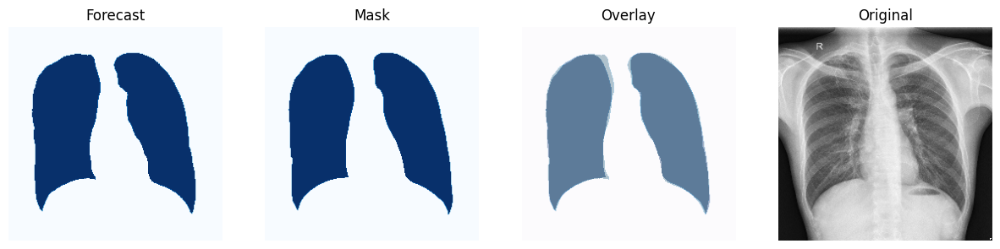

1/1 [==============================] - 0s 23ms/step


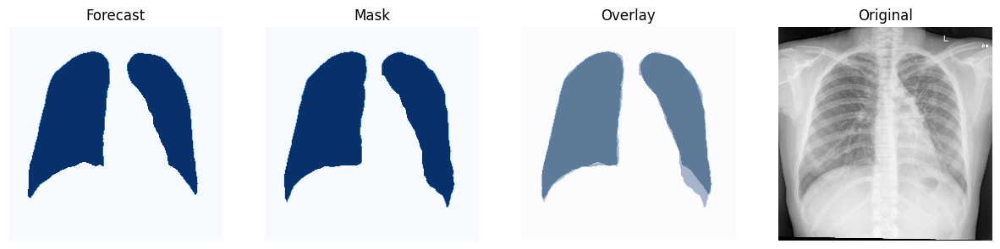

1/1 [==============================] - 0s 21ms/step


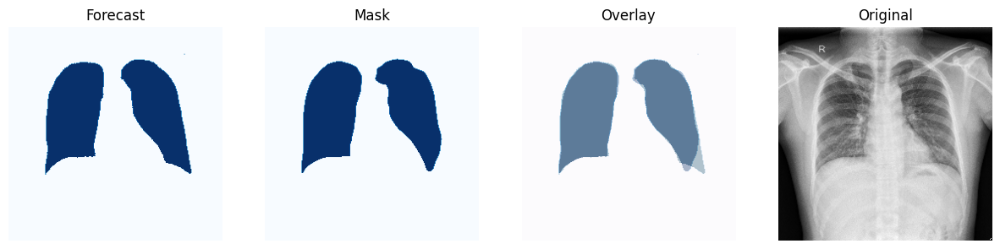

1/1 [==============================] - 0s 21ms/step


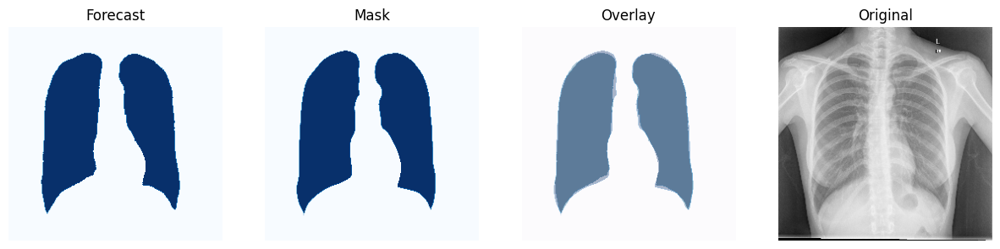

1/1 [==============================] - 0s 20ms/step


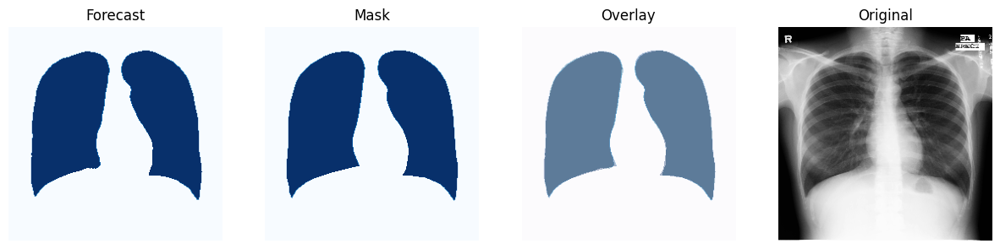

1/1 [==============================] - 0s 21ms/step


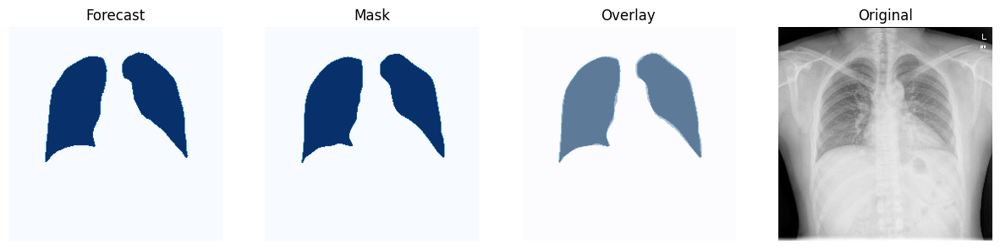

1/1 [==============================] - 0s 22ms/step


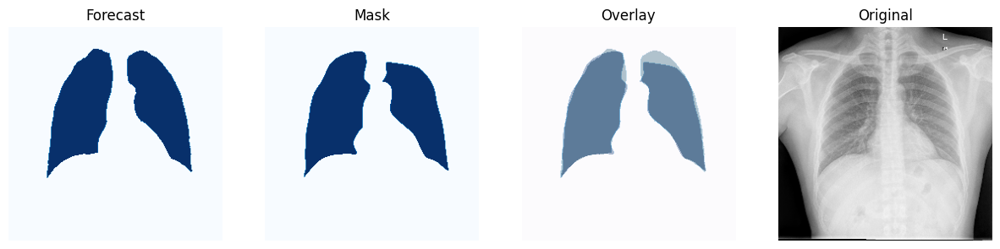

1/1 [==============================] - 0s 21ms/step


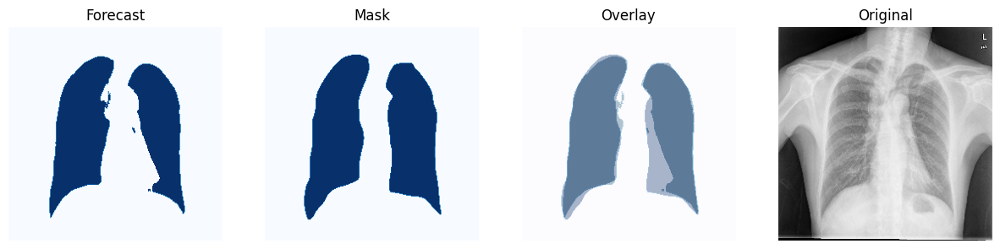

1/1 [==============================] - 0s 21ms/step


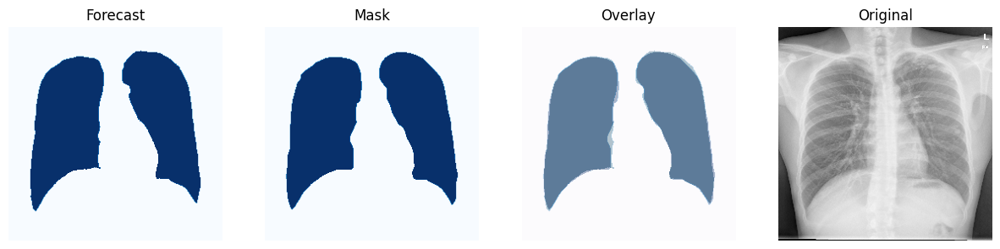

1/1 [==============================] - 0s 23ms/step


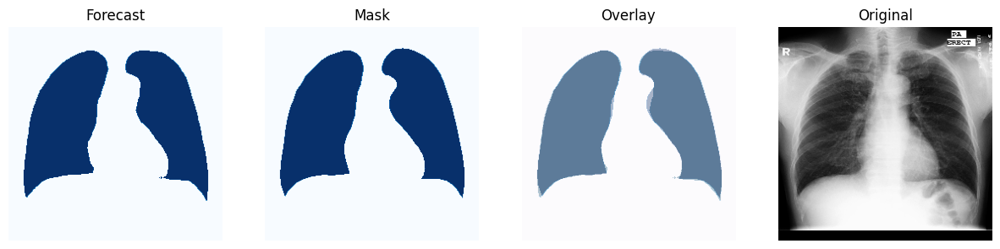

1/1 [==============================] - 0s 20ms/step


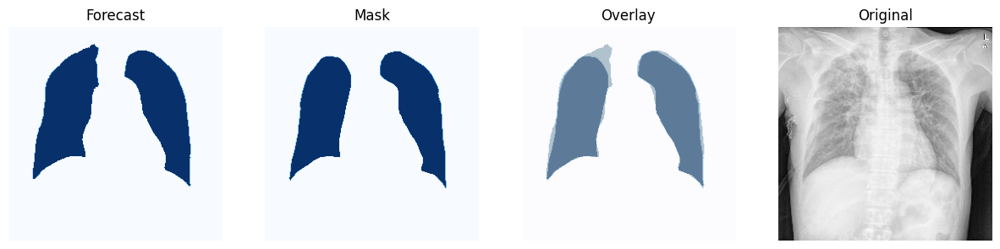

1/1 [==============================] - 0s 23ms/step


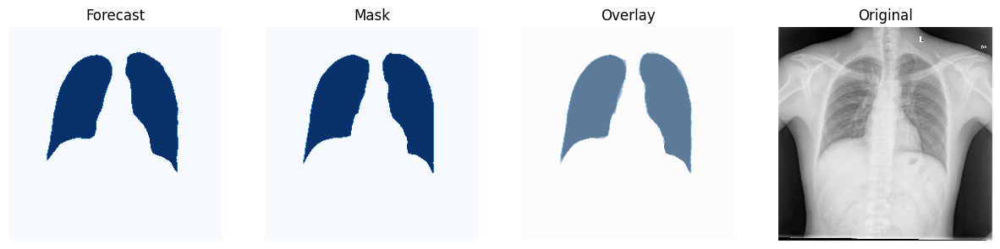

1/1 [==============================] - 0s 21ms/step


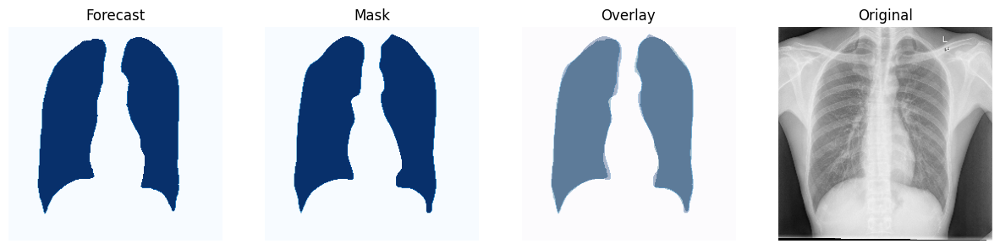

1/1 [==============================] - 0s 24ms/step


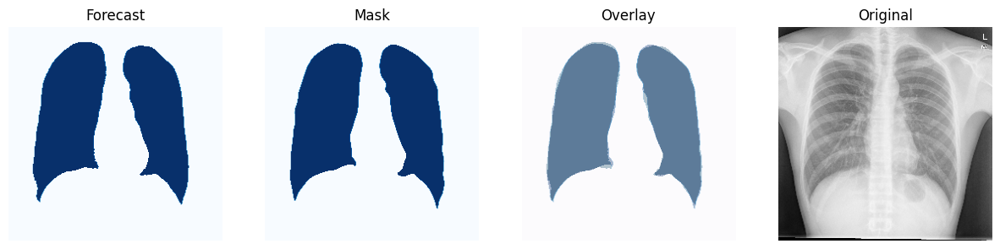

1/1 [==============================] - 0s 21ms/step


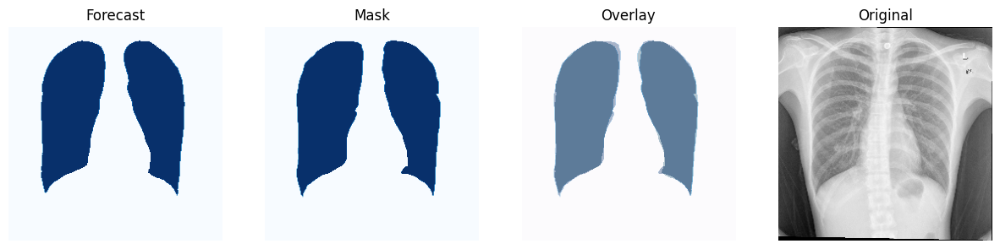

1/1 [==============================] - 0s 26ms/step


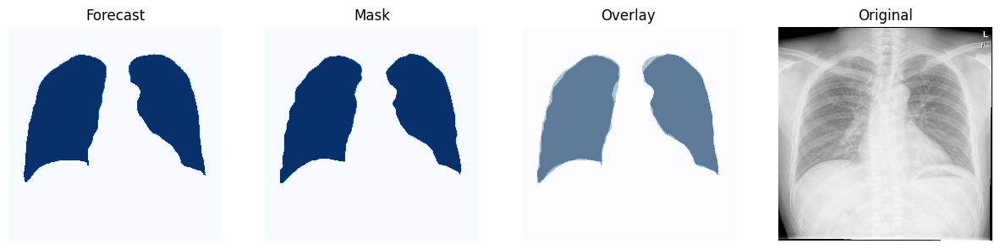

1/1 [==============================] - 0s 23ms/step


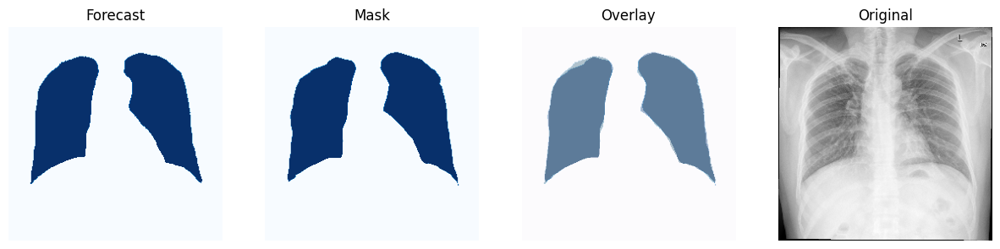

1/1 [==============================] - 0s 20ms/step


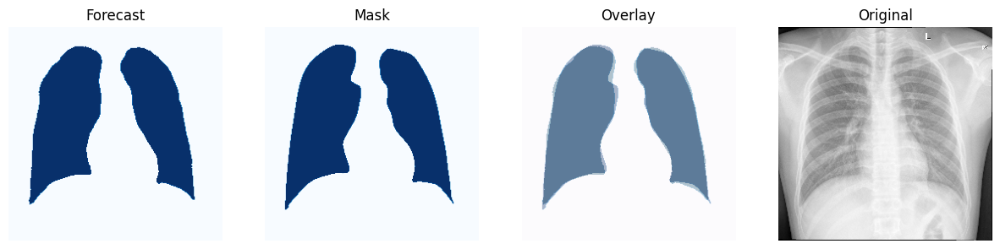

1/1 [==============================] - 0s 21ms/step


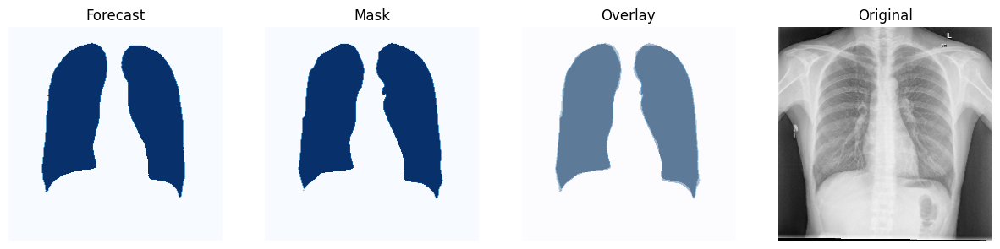

1/1 [==============================] - 0s 21ms/step


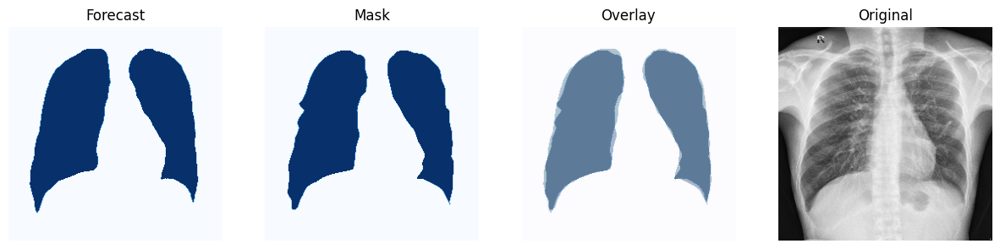

1/1 [==============================] - 0s 21ms/step


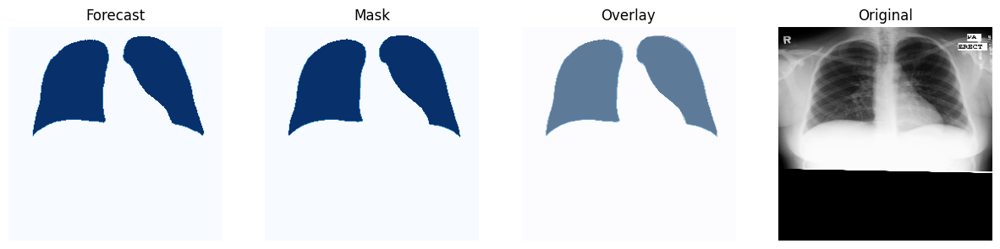

1/1 [==============================] - 0s 22ms/step


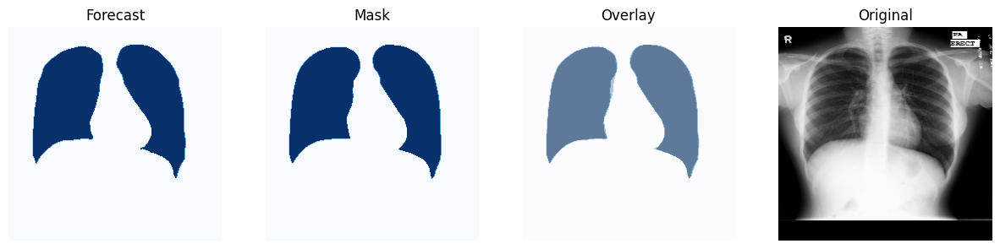

1/1 [==============================] - 0s 24ms/step


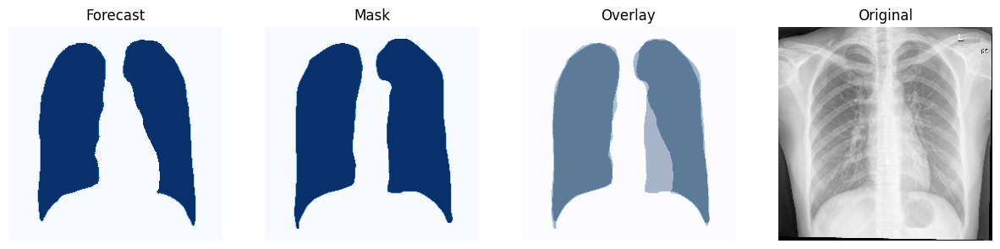

1/1 [==============================] - 0s 24ms/step


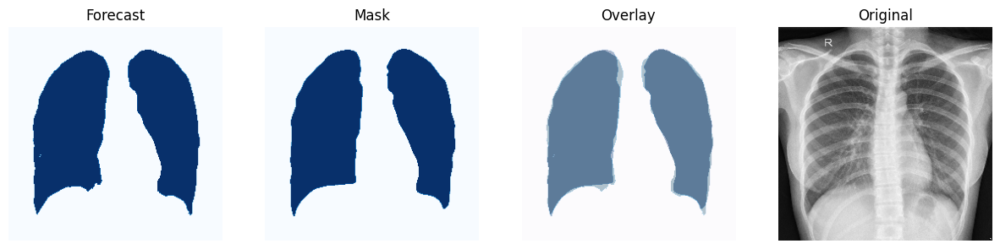

1/1 [==============================] - 0s 22ms/step


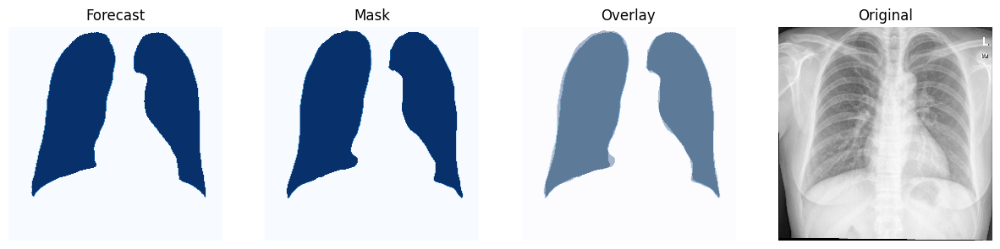

1/1 [==============================] - 0s 22ms/step


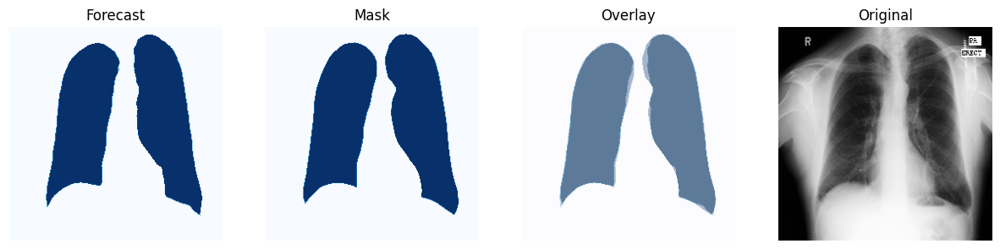

1/1 [==============================] - 0s 22ms/step


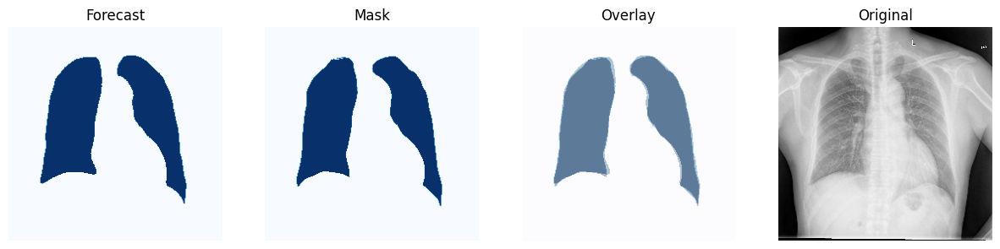

1/1 [==============================] - 0s 22ms/step


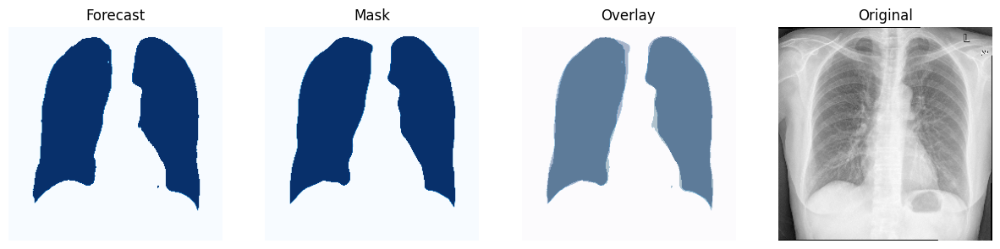

1/1 [==============================] - 0s 20ms/step


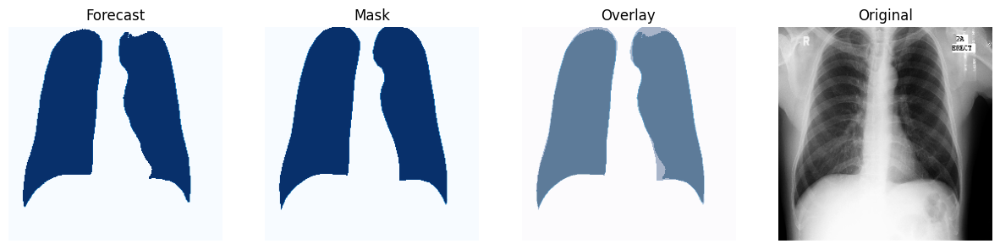

1/1 [==============================] - 0s 23ms/step


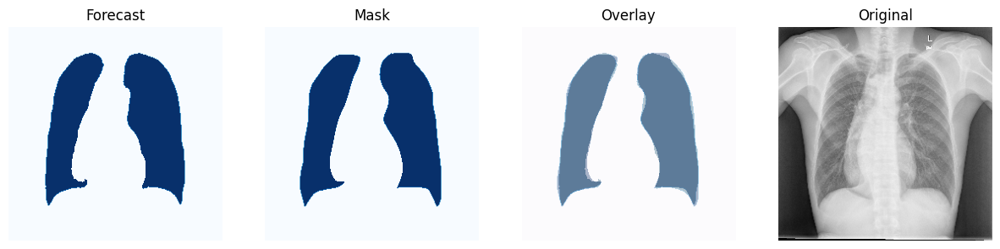

1/1 [==============================] - 0s 23ms/step


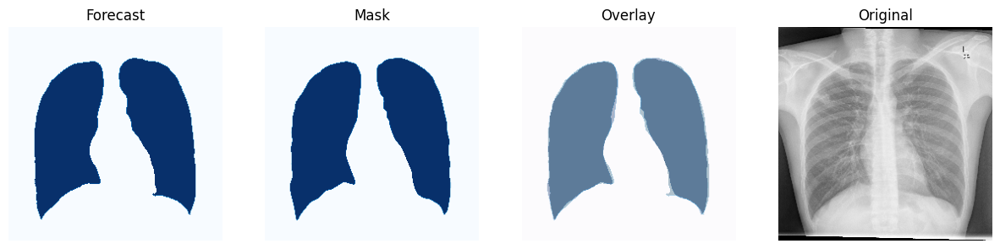

1/1 [==============================] - 0s 21ms/step


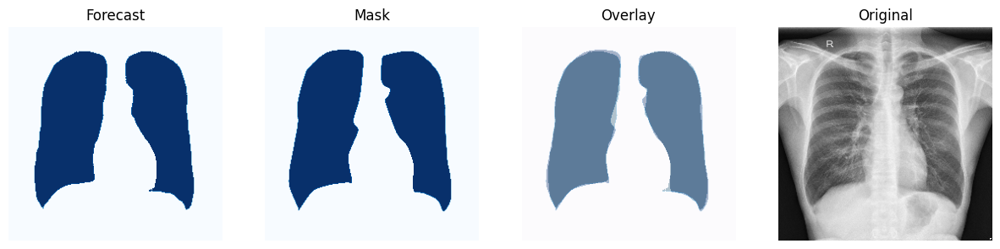

1/1 [==============================] - 0s 22ms/step


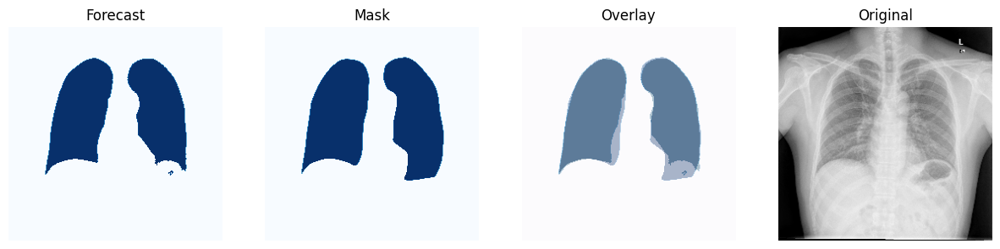

1/1 [==============================] - 0s 21ms/step


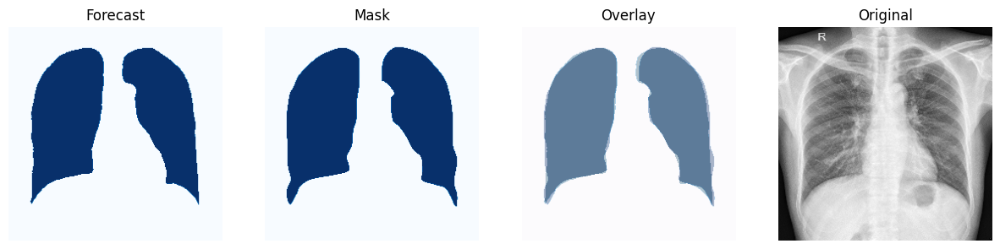

1/1 [==============================] - 0s 21ms/step


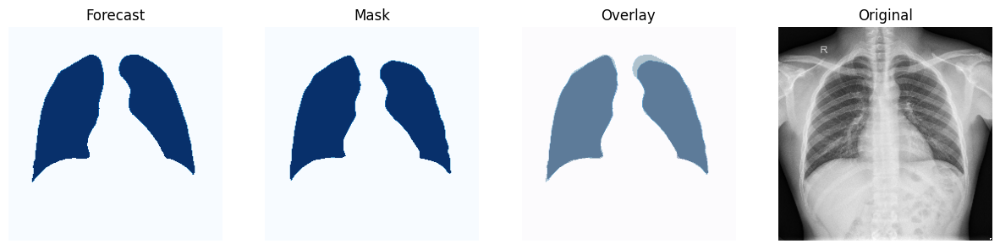

1/1 [==============================] - 0s 22ms/step


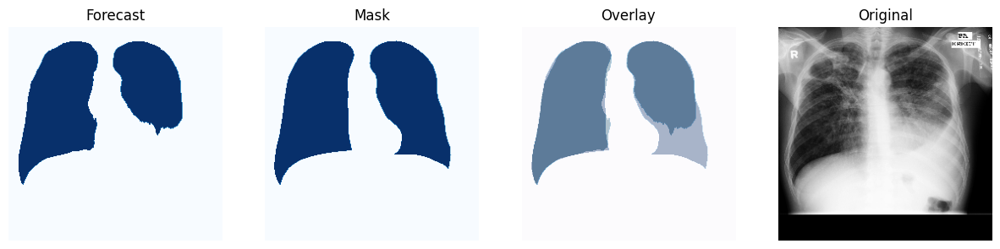

1/1 [==============================] - 0s 22ms/step


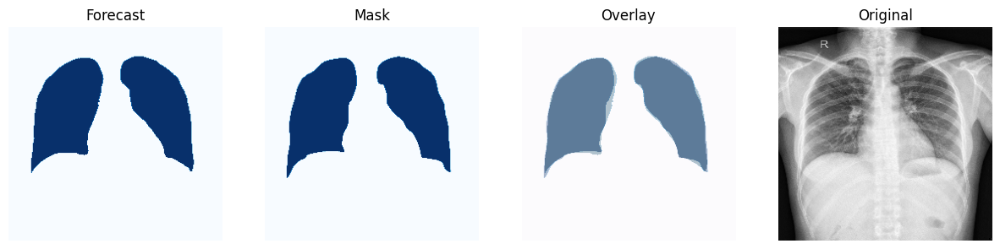

1/1 [==============================] - 0s 22ms/step


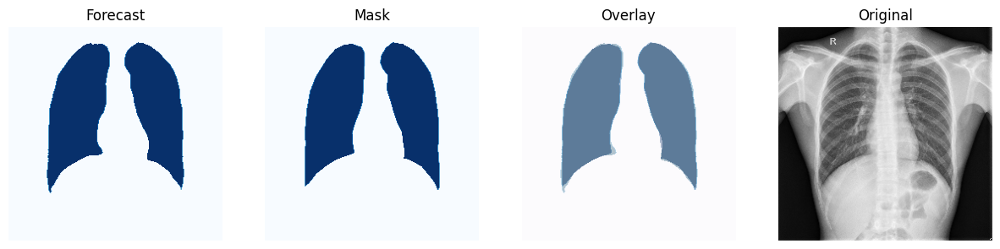

1/1 [==============================] - 0s 21ms/step


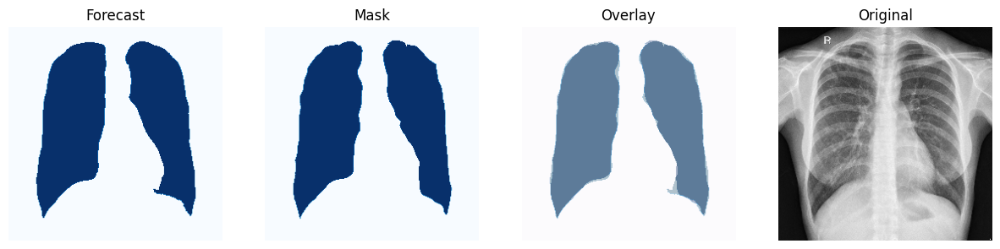

1/1 [==============================] - 0s 24ms/step


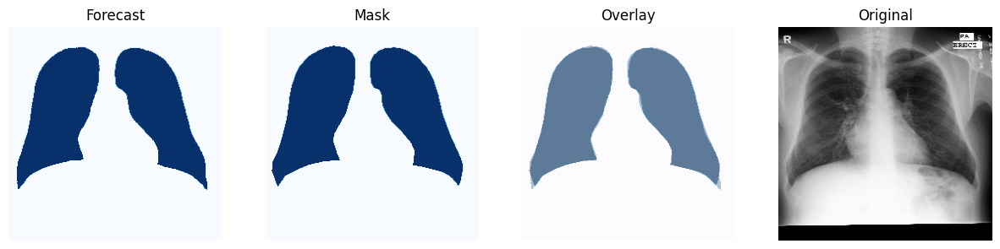

1/1 [==============================] - 0s 24ms/step


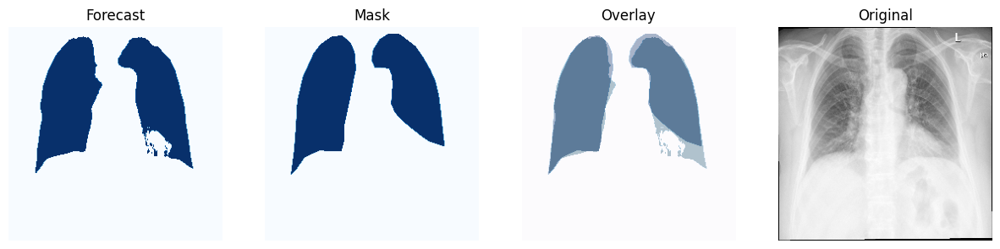

1/1 [==============================] - 0s 24ms/step


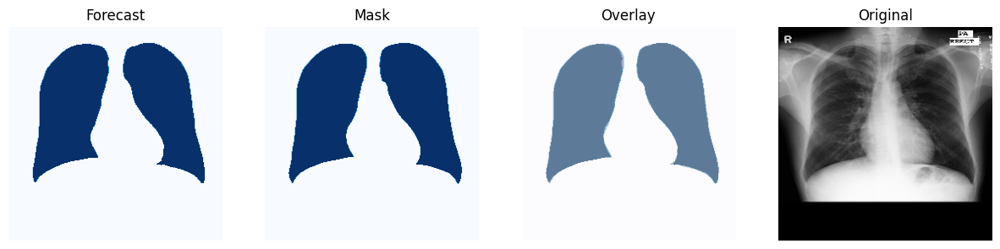

1/1 [==============================] - 0s 21ms/step


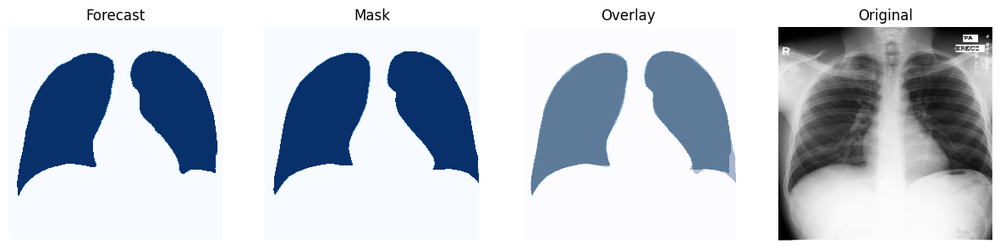

1/1 [==============================] - 0s 23ms/step


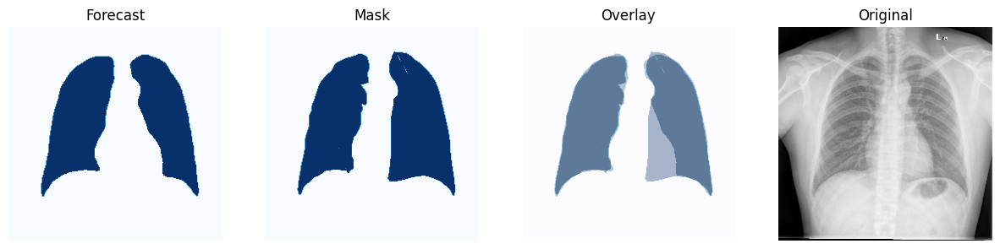

1/1 [==============================] - 0s 23ms/step


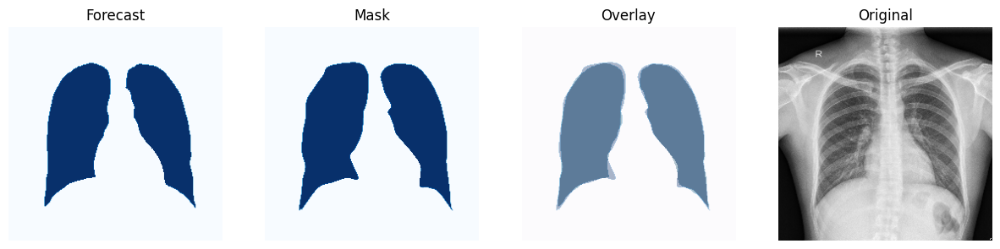

1/1 [==============================] - 0s 23ms/step


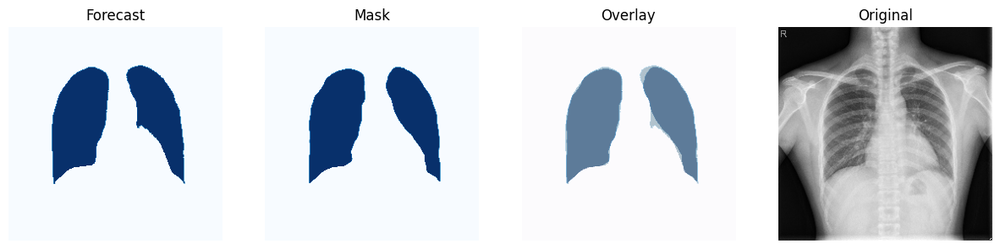

1/1 [==============================] - 0s 20ms/step


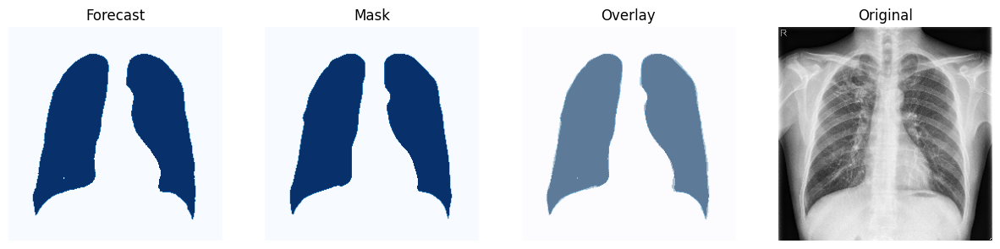

1/1 [==============================] - 0s 22ms/step


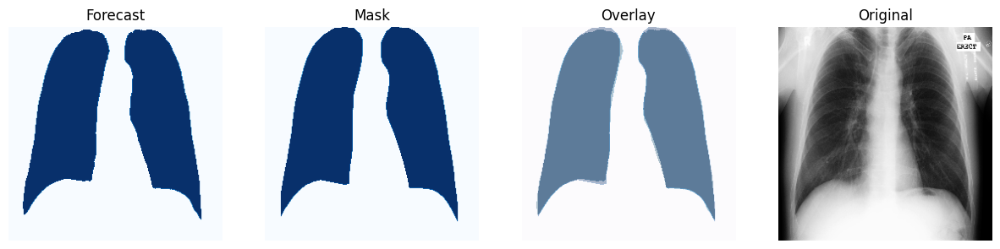

1/1 [==============================] - 0s 21ms/step


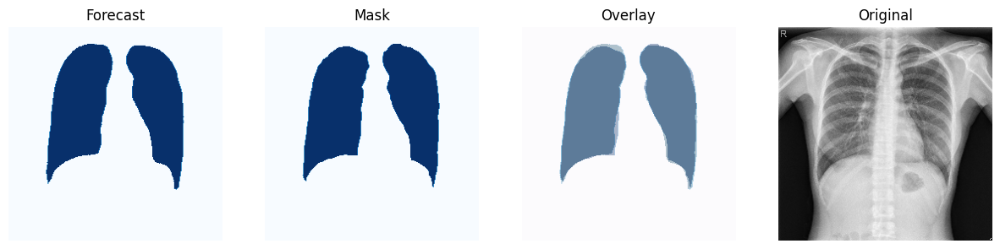

1/1 [==============================] - 0s 23ms/step


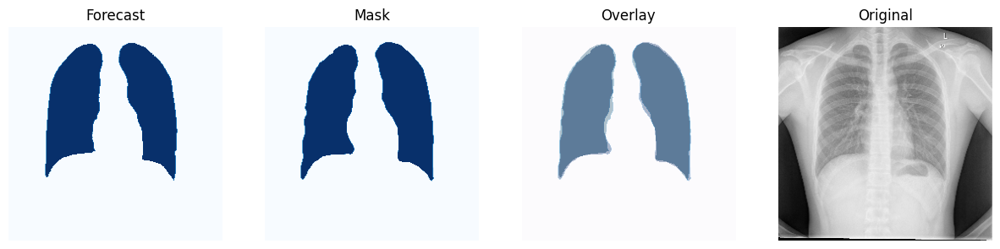

1/1 [==============================] - 0s 21ms/step


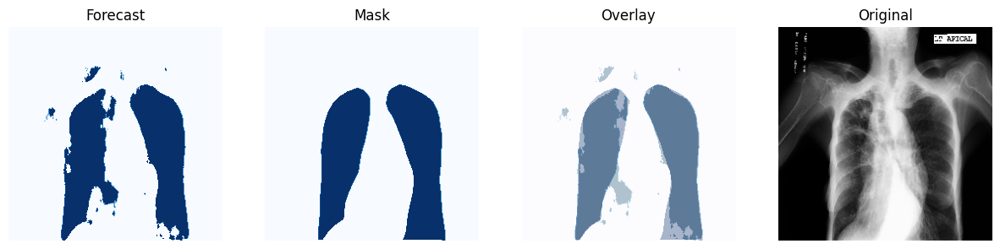

1/1 [==============================] - 0s 23ms/step


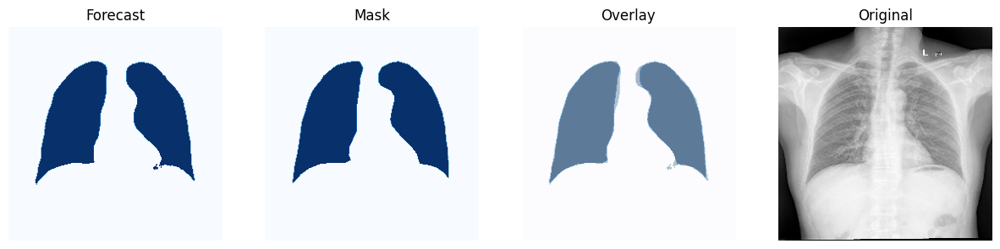

1/1 [==============================] - 0s 22ms/step


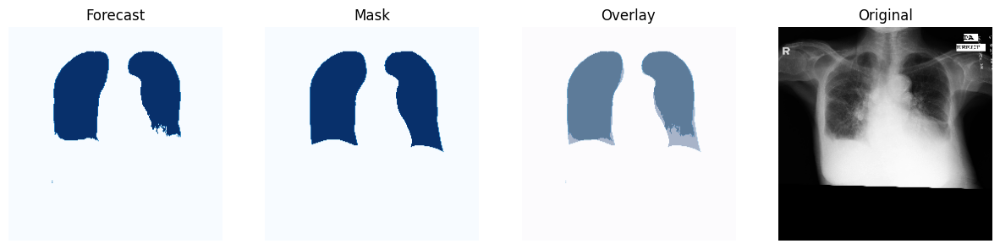

1/1 [==============================] - 0s 22ms/step


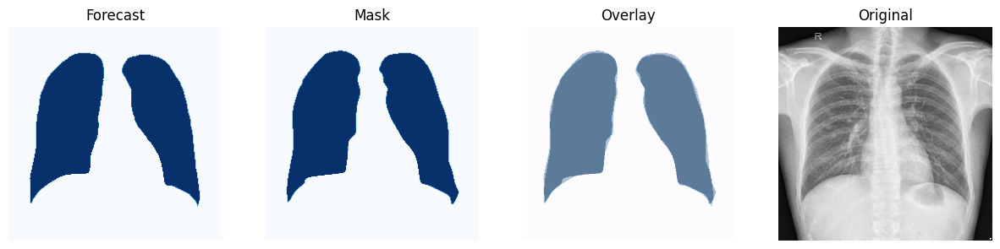

1/1 [==============================] - 0s 22ms/step


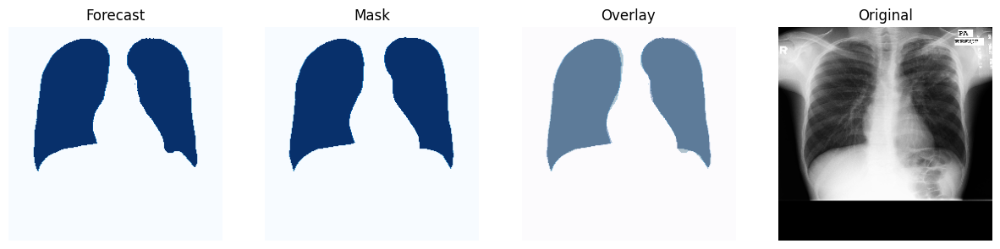

1/1 [==============================] - 0s 21ms/step


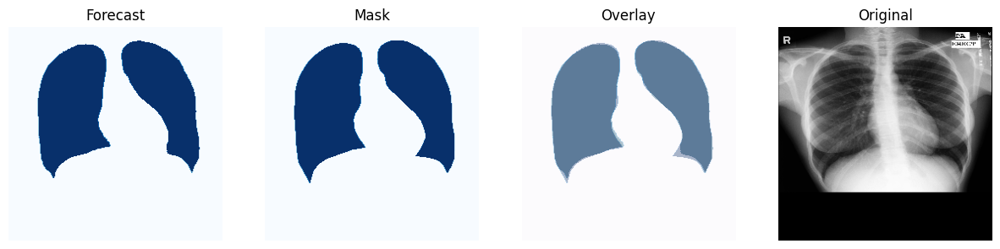

1/1 [==============================] - 0s 21ms/step


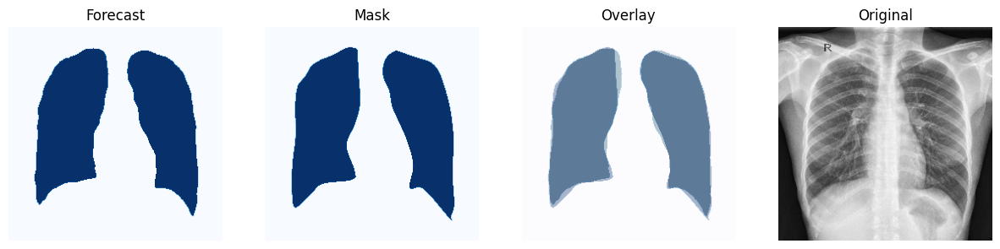

1/1 [==============================] - 0s 20ms/step


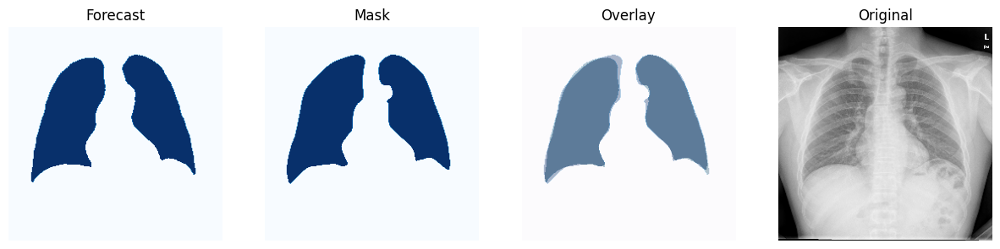

1/1 [==============================] - 0s 24ms/step


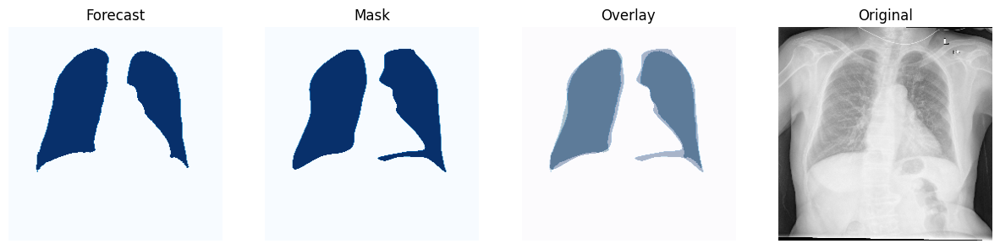

1/1 [==============================] - 0s 20ms/step


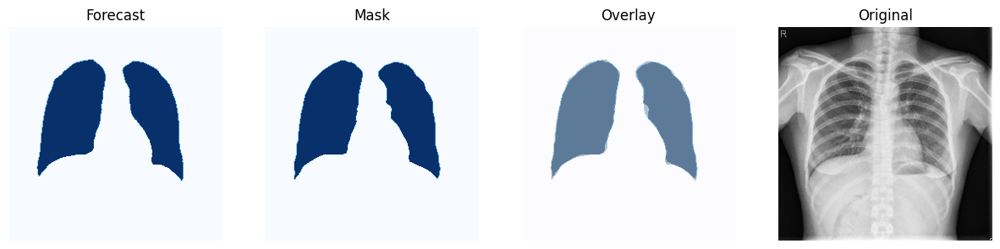

1/1 [==============================] - 0s 22ms/step


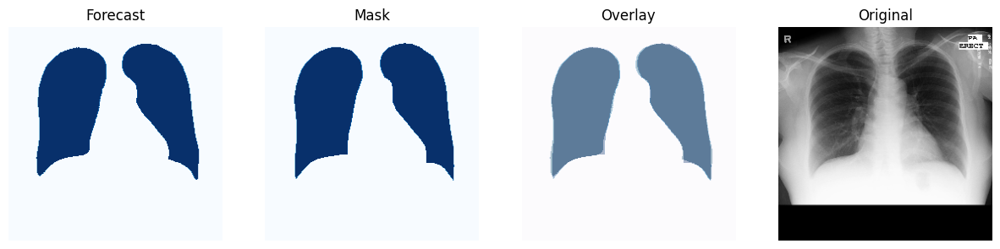

1/1 [==============================] - 0s 22ms/step


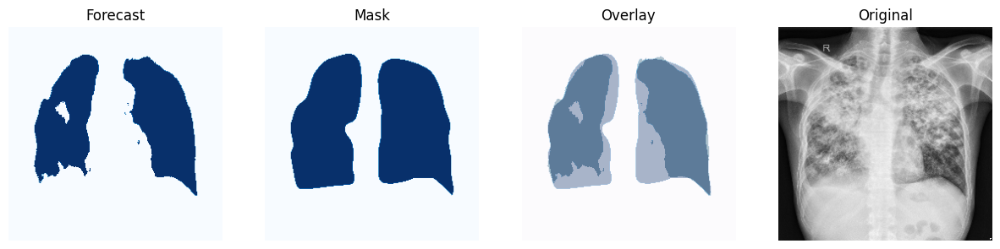

1/1 [==============================] - 0s 21ms/step


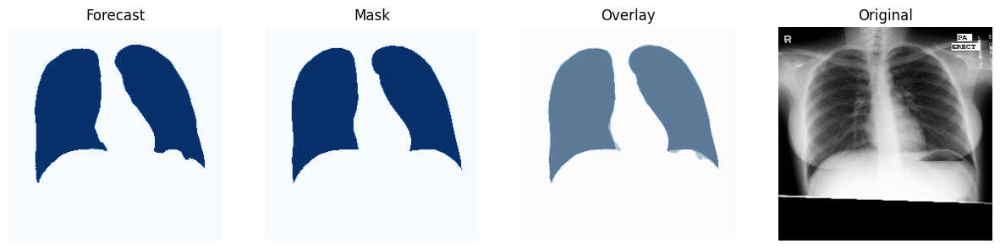

1/1 [==============================] - 0s 23ms/step


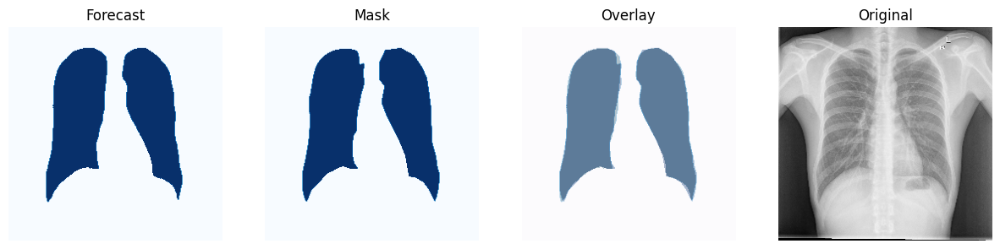

1/1 [==============================] - 0s 21ms/step


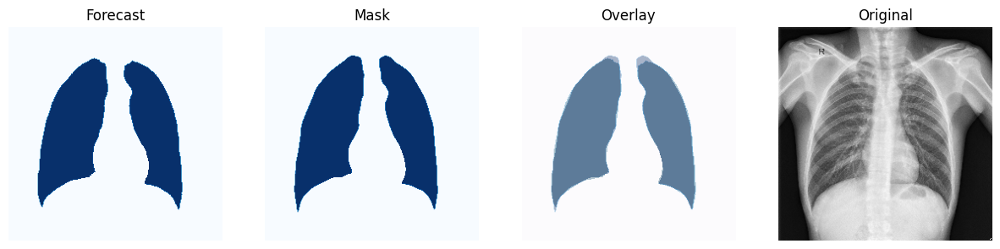

1/1 [==============================] - 0s 22ms/step


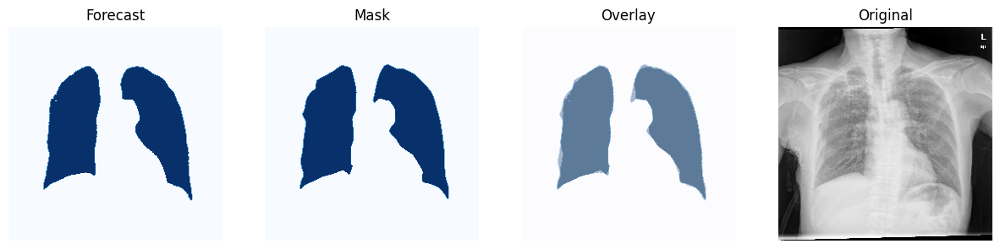

1/1 [==============================] - 0s 23ms/step


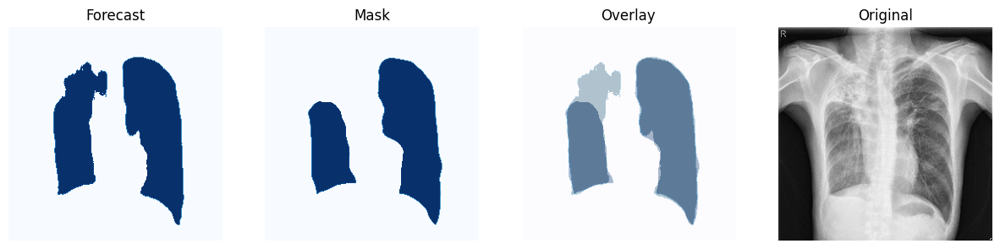

1/1 [==============================] - 0s 21ms/step


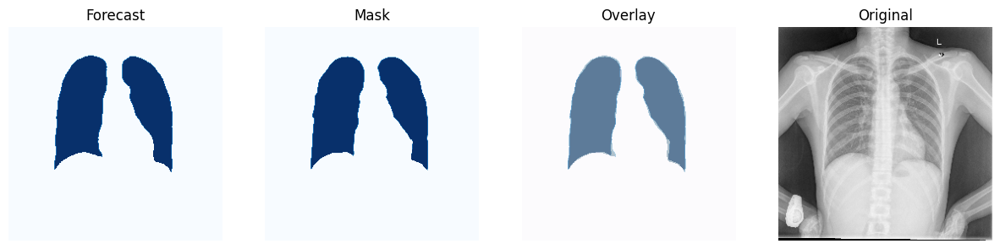

1/1 [==============================] - 0s 21ms/step


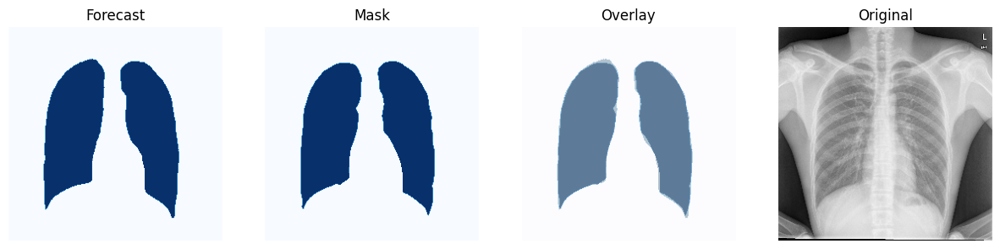

1/1 [==============================] - 0s 21ms/step


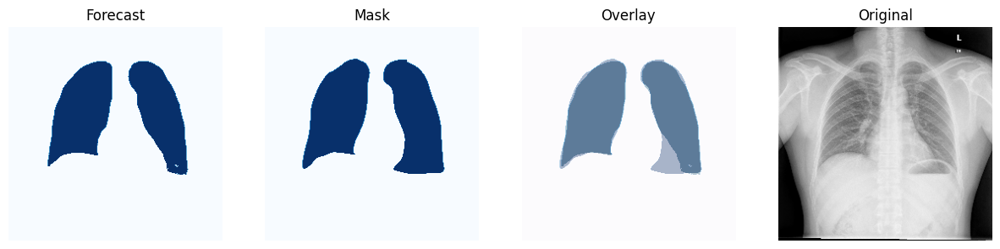

1/1 [==============================] - 0s 22ms/step


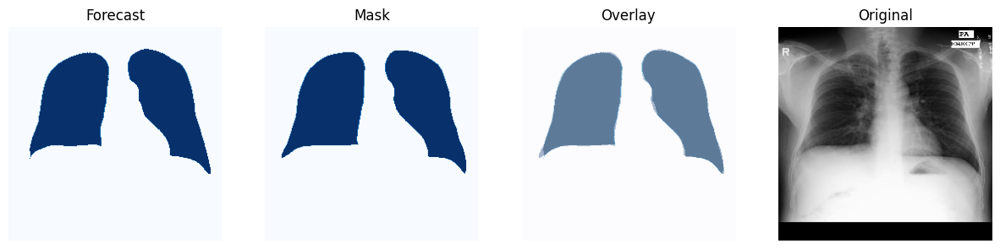

1/1 [==============================] - 0s 21ms/step


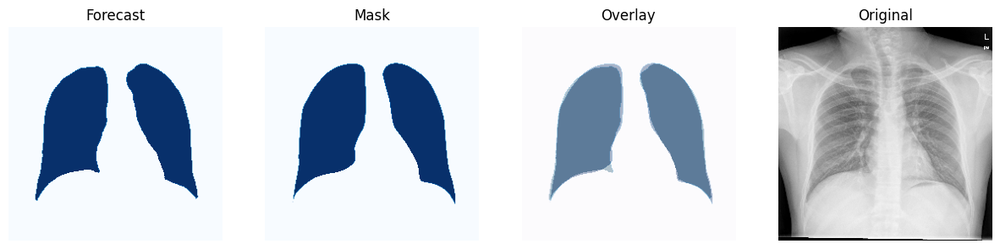

1/1 [==============================] - 0s 20ms/step


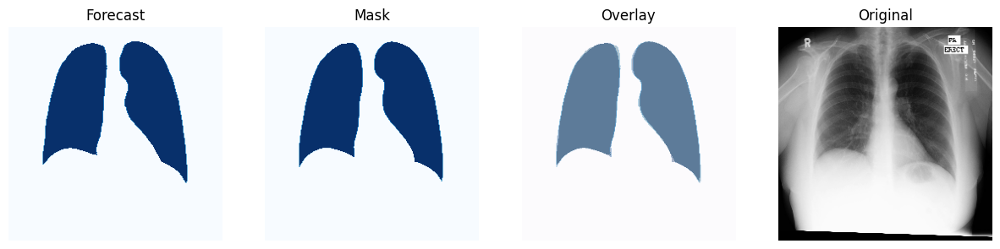

1/1 [==============================] - 0s 27ms/step


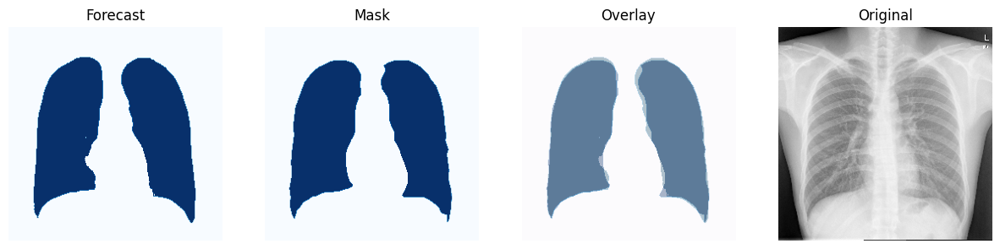

1/1 [==============================] - 0s 22ms/step


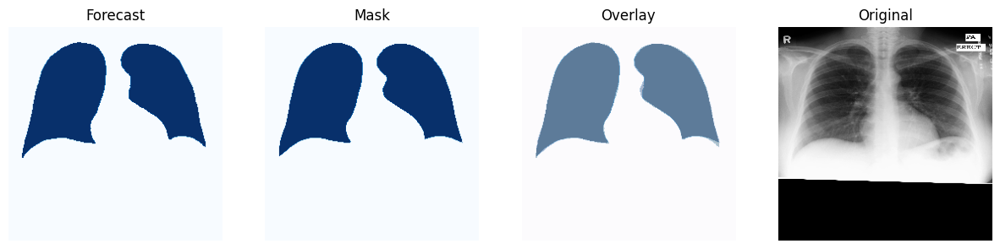

1/1 [==============================] - 0s 21ms/step


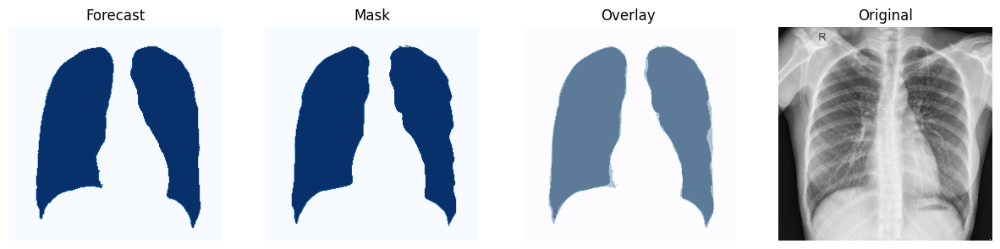

1/1 [==============================] - 0s 21ms/step


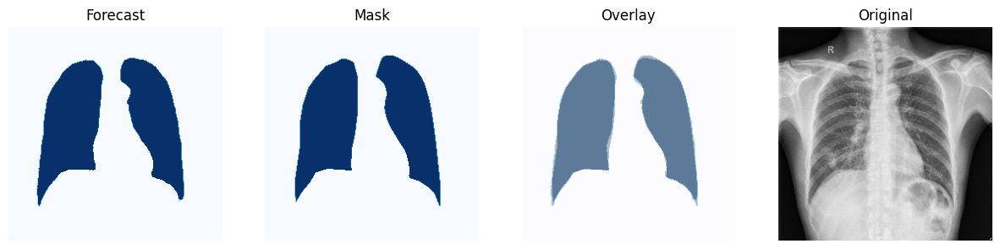

1/1 [==============================] - 0s 22ms/step


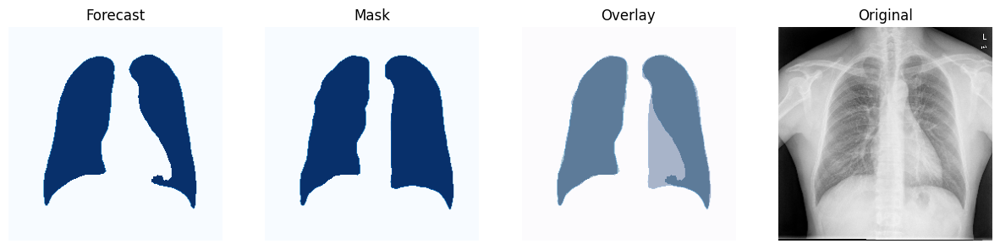

1/1 [==============================] - 0s 22ms/step


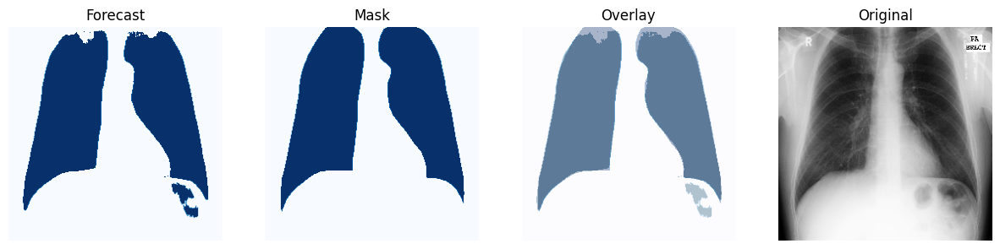

1/1 [==============================] - 0s 24ms/step


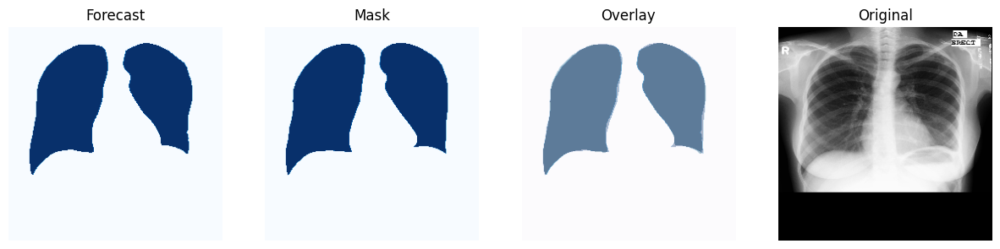

1/1 [==============================] - 0s 24ms/step


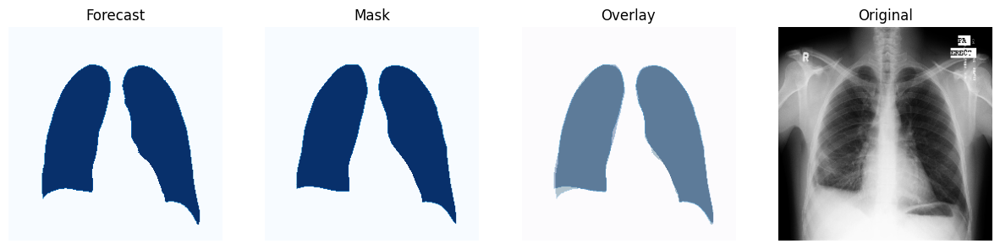

1/1 [==============================] - 0s 23ms/step


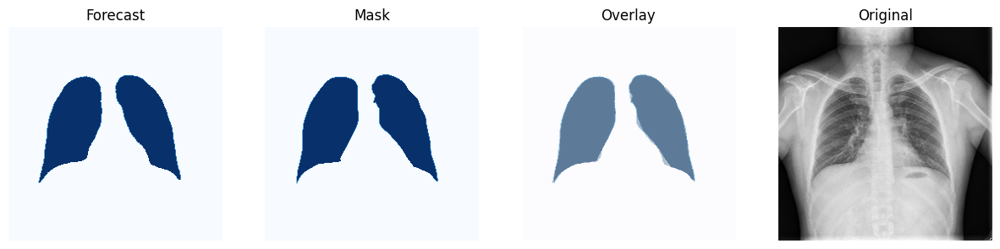

1/1 [==============================] - 0s 21ms/step


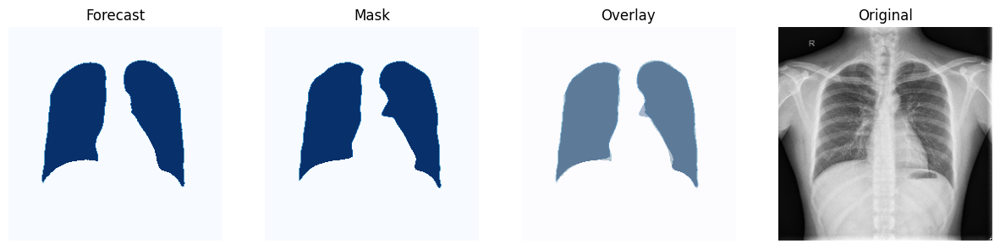

1/1 [==============================] - 0s 22ms/step


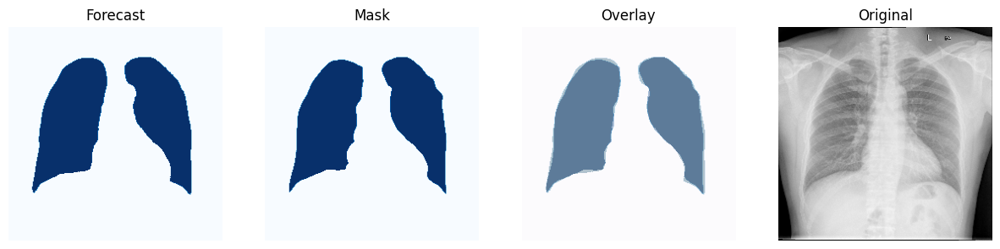

1/1 [==============================] - 0s 22ms/step


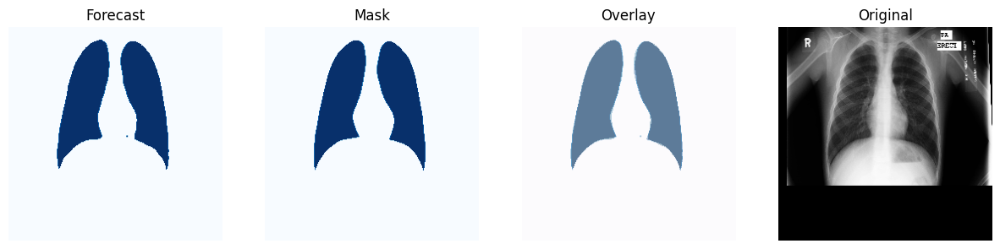

Test Accuracy (Average): 0.9807808517564273


In [16]:
def test_accuracy(y_true, y_pred, threshold=0.5):
    # Convert predictions to binary (0 or 1) based on threshold
    y_pred_binary = (y_pred > threshold).astype(int)

    # Count the number of correct predictions
    correct_predictions = np.sum(y_true == y_pred_binary)

    # Calculate total number of pixels in the ground truth
    total_pixels = y_true.size

    # Calculate accuracy as the ratio of correct predictions to total pixels
    accuracy = correct_predictions / total_pixels

    # Return the accuracy value
    return accuracy

# Initialize an empty list to store accuracies for each test image
test_accuracies = []

# Set a threshold value for classification
threshold = 0.5  # Adjust this threshold as needed

# Loop over each image in the test dataset
for i in range(len(img_test)):
    # Generate a prediction for the current test image
    prediction = test_on_image(model, img_array=img_test, img_num=i, img_side_size=256)

    # Calculate the accuracy of the prediction compared to the ground truth mask
    accuracy = test_accuracy(mask_test[i], prediction, threshold)

    # Append the calculated accuracy to the list
    test_accuracies.append(accuracy)

# Calculate the average accuracy across all test images
average_test_accuracy = np.mean(test_accuracies)

# Print the average test accuracy
print("Test Accuracy (Average):", average_test_accuracy)


In [17]:
def predict_single_image(model, image):
    # Resize and preprocess the image
    input_size = (256, 256)
    image_resized = cv2.resize(image, input_size)
    image_preprocessed = image_resized / 255.0
    image_preprocessed = image_preprocessed.reshape(1, *input_size, 1)

    # Make predictions
    predictions = model.predict(image_preprocessed)

    return image_resized, predictions

def create_composite_image(original, mask, overlay):
    # Ensure all images are in the same scale
    mask_scaled = (mask * 255).astype(np.uint8)
    overlay_scaled = (overlay * 255).astype(np.uint8)

    # Stack images horizontally
    return np.hstack((original, mask_scaled, overlay_scaled))

def process_and_save_images(folder_path, save_folder):
    # Create the directory for saving images if it doesn't exist
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    # Process each image in the folder
    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.bmp')):
            image_path = os.path.join(folder_path, filename)
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

            if image is not None:
                resized_image, predictions = predict_single_image(model, image)

                # Create an overlay
                overlay = resized_image + 0.3 * (predictions[0, :, :, 0] * 255)

                # Create a composite image
                composite_image = create_composite_image(resized_image, predictions[0, :, :, 0], overlay)

                # Save the composite image
                composite_filename = 'composite_' + filename
                cv2.imwrite(os.path.join(save_folder, composite_filename), composite_image)

# Folder containing images
input_folder = "/content/drive/MyDrive/extra/test_normal"
# Folder to save processed images
output_folder = "/content/drive/MyDrive/extra/Seg_test_normal"

process_and_save_images(input_folder, output_folder)


1/1 [==============================] - 0s 21ms/step
